In [ ]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
Data_Dir = "/content/drive/MyDrive/Train"

In [12]:
print(os.listdir(Data_Dir))

['Isola']


In [13]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_ds = ImageFolder(Data_Dir, transform=tt.Compose([ tt.Resize(image_size),
                                                        tt.CenterCrop(image_size),
                                                        tt.ToTensor(),
                                                        tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [14]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [15]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


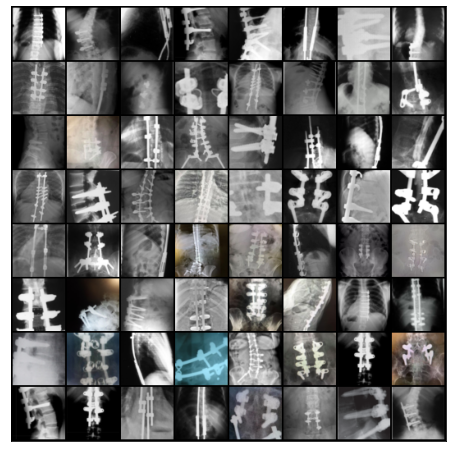

In [16]:
show_batch(train_dl)

In [17]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [18]:
device = get_default_device()
device

device(type='cuda')

In [19]:
train_dl = DeviceDataLoader(train_dl, device)

In [20]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [21]:
discriminator = to_device(discriminator, device)

In [22]:
latent_size = 128

In [23]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


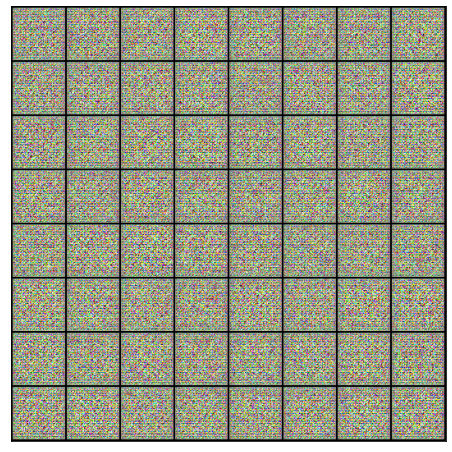

In [24]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [25]:
generator = to_device(generator, device)

In [26]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [27]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [28]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [29]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [30]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


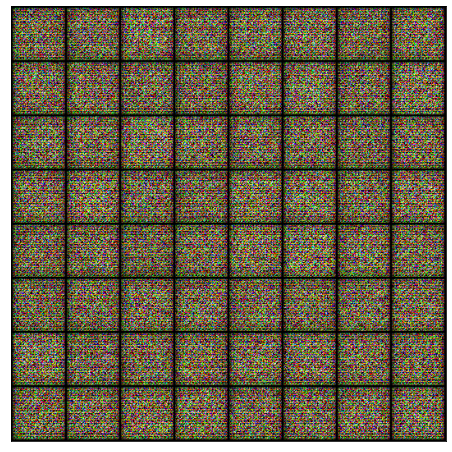

In [31]:
save_samples(0, fixed_latent)

In [32]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [38]:
lr = 0.0002
epochs = 1100

In [39]:
history = fit(epochs, lr)

  0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch [1/1100], loss_g: 20.0772, loss_d: 0.0077, real_score: 0.9969, fake_score: 0.0046
Saving generated-images-0001.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [2/1100], loss_g: 21.5712, loss_d: 0.0026, real_score: 0.9974, fake_score: 0.0000
Saving generated-images-0002.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [3/1100], loss_g: 20.7806, loss_d: 0.0002, real_score: 0.9998, fake_score: 0.0000
Saving generated-images-0003.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [4/1100], loss_g: 19.7950, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0004.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [5/1100], loss_g: 18.6107, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0005.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [6/1100], loss_g: 17.3377, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0006.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [7/1100], loss_g: 16.0550, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0007.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [8/1100], loss_g: 14.7249, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0008.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [9/1100], loss_g: 13.4824, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0009.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [10/1100], loss_g: 12.3061, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0010.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [11/1100], loss_g: 11.2703, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0011.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [12/1100], loss_g: 10.4351, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0012.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [13/1100], loss_g: 10.1315, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0013.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [14/1100], loss_g: 10.3585, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0014.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [15/1100], loss_g: 10.7315, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0015.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [16/1100], loss_g: 10.9461, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0016.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [17/1100], loss_g: 10.9707, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0017.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [18/1100], loss_g: 10.9482, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0018.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [19/1100], loss_g: 11.0853, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0019.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [20/1100], loss_g: 11.3955, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0020.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [21/1100], loss_g: 11.6784, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0021.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [22/1100], loss_g: 11.8481, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0022.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [23/1100], loss_g: 12.0490, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0023.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [24/1100], loss_g: 12.7620, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0024.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [25/1100], loss_g: 12.9057, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0025.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [26/1100], loss_g: 12.7653, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0026.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [27/1100], loss_g: 12.9274, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0027.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [28/1100], loss_g: 13.0393, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0028.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [29/1100], loss_g: 13.1940, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0029.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [30/1100], loss_g: 13.1657, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0030.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [31/1100], loss_g: 13.8672, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0031.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [32/1100], loss_g: 14.1147, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0032.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [33/1100], loss_g: 13.4286, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0033.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [34/1100], loss_g: 13.1663, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0034.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [35/1100], loss_g: 13.1063, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0035.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [36/1100], loss_g: 13.0683, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0036.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [37/1100], loss_g: 12.9186, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0037.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [38/1100], loss_g: 12.8786, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0038.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [39/1100], loss_g: 12.8063, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0039.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [40/1100], loss_g: 12.6831, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0040.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [41/1100], loss_g: 12.5571, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0041.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [42/1100], loss_g: 12.5420, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0042.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [43/1100], loss_g: 12.3470, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0043.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [44/1100], loss_g: 14.2476, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0044.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [45/1100], loss_g: 13.4519, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0045.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [46/1100], loss_g: 12.3978, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0046.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [47/1100], loss_g: 15.0664, loss_d: 0.0001, real_score: 1.0000, fake_score: 0.0001
Saving generated-images-0047.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [48/1100], loss_g: 13.3286, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0048.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [49/1100], loss_g: 28.9714, loss_d: 0.0038, real_score: 0.9999, fake_score: 0.0037
Saving generated-images-0049.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [50/1100], loss_g: 19.5788, loss_d: 16.8605, real_score: 0.0000, fake_score: 0.0000
Saving generated-images-0050.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [51/1100], loss_g: 4.5967, loss_d: 1.4500, real_score: 0.6859, fake_score: 0.0000
Saving generated-images-0051.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [52/1100], loss_g: 13.8558, loss_d: 7.6887, real_score: 0.9998, fake_score: 0.9995
Saving generated-images-0052.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [53/1100], loss_g: 12.4668, loss_d: 1.2597, real_score: 0.5296, fake_score: 0.0000
Saving generated-images-0053.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [54/1100], loss_g: 9.4770, loss_d: 0.6796, real_score: 0.6489, fake_score: 0.0000
Saving generated-images-0054.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [55/1100], loss_g: 6.5516, loss_d: 0.2175, real_score: 0.8446, fake_score: 0.0005
Saving generated-images-0055.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [56/1100], loss_g: 4.1674, loss_d: 0.0806, real_score: 0.9402, fake_score: 0.0116
Saving generated-images-0056.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [57/1100], loss_g: 4.5937, loss_d: 0.1976, real_score: 0.9732, fake_score: 0.1515
Saving generated-images-0057.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [58/1100], loss_g: 5.5010, loss_d: 0.1503, real_score: 0.9763, fake_score: 0.1138
Saving generated-images-0058.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [59/1100], loss_g: 5.6313, loss_d: 0.1129, real_score: 0.9660, fake_score: 0.0674
Saving generated-images-0059.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [60/1100], loss_g: 5.8385, loss_d: 0.1862, real_score: 0.9490, fake_score: 0.1092
Saving generated-images-0060.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [61/1100], loss_g: 5.5665, loss_d: 0.2198, real_score: 0.9166, fake_score: 0.1037
Saving generated-images-0061.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [62/1100], loss_g: 6.3456, loss_d: 0.3309, real_score: 0.8873, fake_score: 0.1498
Saving generated-images-0062.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [63/1100], loss_g: 6.0573, loss_d: 0.2607, real_score: 0.8578, fake_score: 0.0702
Saving generated-images-0063.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [64/1100], loss_g: 6.2136, loss_d: 0.1961, real_score: 0.9097, fake_score: 0.0794
Saving generated-images-0064.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [65/1100], loss_g: 7.0726, loss_d: 0.1800, real_score: 0.9402, fake_score: 0.0984
Saving generated-images-0065.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [66/1100], loss_g: 6.7278, loss_d: 0.1160, real_score: 0.9381, fake_score: 0.0402
Saving generated-images-0066.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [67/1100], loss_g: 7.4578, loss_d: 0.1195, real_score: 0.9513, fake_score: 0.0565
Saving generated-images-0067.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [68/1100], loss_g: 6.3683, loss_d: 0.0829, real_score: 0.9530, fake_score: 0.0281
Saving generated-images-0068.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [69/1100], loss_g: 7.1901, loss_d: 0.1027, real_score: 0.9701, fake_score: 0.0653
Saving generated-images-0069.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [70/1100], loss_g: 7.4513, loss_d: 0.0710, real_score: 0.9658, fake_score: 0.0330
Saving generated-images-0070.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [71/1100], loss_g: 6.7124, loss_d: 0.0701, real_score: 0.9656, fake_score: 0.0324
Saving generated-images-0071.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [72/1100], loss_g: 8.0359, loss_d: 0.1175, real_score: 0.9691, fake_score: 0.0795
Saving generated-images-0072.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [73/1100], loss_g: 6.4427, loss_d: 0.0909, real_score: 0.9368, fake_score: 0.0159
Saving generated-images-0073.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [74/1100], loss_g: 9.0327, loss_d: 0.1470, real_score: 0.9672, fake_score: 0.1020
Saving generated-images-0074.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [75/1100], loss_g: 7.3480, loss_d: 0.1215, real_score: 0.9068, fake_score: 0.0076
Saving generated-images-0075.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [76/1100], loss_g: 7.0607, loss_d: 0.0684, real_score: 0.9813, fake_score: 0.0461
Saving generated-images-0076.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [77/1100], loss_g: 8.6388, loss_d: 0.0902, real_score: 0.9841, fake_score: 0.0648
Saving generated-images-0077.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [78/1100], loss_g: 7.9513, loss_d: 0.0491, real_score: 0.9672, fake_score: 0.0136
Saving generated-images-0078.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [79/1100], loss_g: 7.4778, loss_d: 0.0542, real_score: 0.9722, fake_score: 0.0239
Saving generated-images-0079.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [80/1100], loss_g: 6.7451, loss_d: 0.0428, real_score: 0.9846, fake_score: 0.0261
Saving generated-images-0080.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [81/1100], loss_g: 7.1525, loss_d: 0.0561, real_score: 0.9841, fake_score: 0.0382
Saving generated-images-0081.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [82/1100], loss_g: 6.7525, loss_d: 0.0517, real_score: 0.9768, fake_score: 0.0265
Saving generated-images-0082.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [83/1100], loss_g: 7.3901, loss_d: 0.0725, real_score: 0.9740, fake_score: 0.0434
Saving generated-images-0083.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [84/1100], loss_g: 7.4097, loss_d: 0.0742, real_score: 0.9636, fake_score: 0.0345
Saving generated-images-0084.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [85/1100], loss_g: 8.2045, loss_d: 0.0780, real_score: 0.9718, fake_score: 0.0467
Saving generated-images-0085.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [86/1100], loss_g: 7.6317, loss_d: 0.0534, real_score: 0.9639, fake_score: 0.0150
Saving generated-images-0086.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [87/1100], loss_g: 9.7046, loss_d: 0.0830, real_score: 0.9845, fake_score: 0.0637
Saving generated-images-0087.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [88/1100], loss_g: 8.8848, loss_d: 0.0374, real_score: 0.9659, fake_score: 0.0012
Saving generated-images-0088.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [89/1100], loss_g: 7.3253, loss_d: 0.0235, real_score: 0.9795, fake_score: 0.0023
Saving generated-images-0089.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [90/1100], loss_g: 6.0544, loss_d: 0.0275, real_score: 0.9905, fake_score: 0.0174
Saving generated-images-0090.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [91/1100], loss_g: 7.4208, loss_d: 0.0609, real_score: 0.9934, fake_score: 0.0524
Saving generated-images-0091.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [92/1100], loss_g: 7.3347, loss_d: 0.0266, real_score: 0.9885, fake_score: 0.0147
Saving generated-images-0092.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [93/1100], loss_g: 6.3938, loss_d: 0.0341, real_score: 0.9854, fake_score: 0.0189
Saving generated-images-0093.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [94/1100], loss_g: 6.1660, loss_d: 0.0471, real_score: 0.9847, fake_score: 0.0307
Saving generated-images-0094.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [95/1100], loss_g: 7.4750, loss_d: 0.0740, real_score: 0.9826, fake_score: 0.0542
Saving generated-images-0095.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [96/1100], loss_g: 6.8733, loss_d: 0.0378, real_score: 0.9726, fake_score: 0.0092
Saving generated-images-0096.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [97/1100], loss_g: 6.3401, loss_d: 0.0398, real_score: 0.9785, fake_score: 0.0174
Saving generated-images-0097.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [98/1100], loss_g: 5.9875, loss_d: 0.0540, real_score: 0.9851, fake_score: 0.0378
Saving generated-images-0098.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [99/1100], loss_g: 6.4936, loss_d: 0.0391, real_score: 0.9844, fake_score: 0.0229
Saving generated-images-0099.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [100/1100], loss_g: 6.8753, loss_d: 0.0257, real_score: 0.9843, fake_score: 0.0095
Saving generated-images-0100.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [101/1100], loss_g: 5.9732, loss_d: 0.0367, real_score: 0.9874, fake_score: 0.0236
Saving generated-images-0101.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [102/1100], loss_g: 6.4666, loss_d: 0.0371, real_score: 0.9870, fake_score: 0.0235
Saving generated-images-0102.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [103/1100], loss_g: 6.3258, loss_d: 0.0247, real_score: 0.9846, fake_score: 0.0088
Saving generated-images-0103.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [104/1100], loss_g: 6.1439, loss_d: 0.0242, real_score: 0.9867, fake_score: 0.0106
Saving generated-images-0104.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [105/1100], loss_g: 8.2296, loss_d: 0.0796, real_score: 0.9897, fake_score: 0.0664
Saving generated-images-0105.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [106/1100], loss_g: 7.5033, loss_d: 0.0555, real_score: 0.9512, fake_score: 0.0022
Saving generated-images-0106.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [107/1100], loss_g: 6.4870, loss_d: 0.0158, real_score: 0.9875, fake_score: 0.0029
Saving generated-images-0107.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [108/1100], loss_g: 5.9882, loss_d: 0.0169, real_score: 0.9950, fake_score: 0.0118
Saving generated-images-0108.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [109/1100], loss_g: 5.5179, loss_d: 0.0175, real_score: 0.9965, fake_score: 0.0139
Saving generated-images-0109.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [110/1100], loss_g: 6.2601, loss_d: 0.0278, real_score: 0.9964, fake_score: 0.0238
Saving generated-images-0110.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [111/1100], loss_g: 6.4818, loss_d: 0.0154, real_score: 0.9937, fake_score: 0.0090
Saving generated-images-0111.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [112/1100], loss_g: 6.2071, loss_d: 0.0221, real_score: 0.9908, fake_score: 0.0127
Saving generated-images-0112.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [113/1100], loss_g: 6.4575, loss_d: 0.0285, real_score: 0.9883, fake_score: 0.0164
Saving generated-images-0113.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [114/1100], loss_g: 6.2206, loss_d: 0.0238, real_score: 0.9862, fake_score: 0.0097
Saving generated-images-0114.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [115/1100], loss_g: 6.3300, loss_d: 0.0208, real_score: 0.9899, fake_score: 0.0105
Saving generated-images-0115.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [116/1100], loss_g: 7.1028, loss_d: 0.0287, real_score: 0.9919, fake_score: 0.0201
Saving generated-images-0116.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [117/1100], loss_g: 6.9861, loss_d: 0.0287, real_score: 0.9860, fake_score: 0.0143
Saving generated-images-0117.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [118/1100], loss_g: 6.2301, loss_d: 0.0243, real_score: 0.9841, fake_score: 0.0080
Saving generated-images-0118.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [119/1100], loss_g: 7.4684, loss_d: 0.0350, real_score: 0.9907, fake_score: 0.0252
Saving generated-images-0119.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [120/1100], loss_g: 7.1468, loss_d: 0.0527, real_score: 0.9748, fake_score: 0.0260
Saving generated-images-0120.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [121/1100], loss_g: 9.8489, loss_d: 0.1003, real_score: 0.9565, fake_score: 0.0495
Saving generated-images-0121.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [122/1100], loss_g: 3.8984, loss_d: 0.4059, real_score: 0.8303, fake_score: 0.0898
Saving generated-images-0122.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [123/1100], loss_g: 16.5316, loss_d: 1.9733, real_score: 0.9728, fake_score: 0.5302
Saving generated-images-0123.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [124/1100], loss_g: 10.8248, loss_d: 5.2439, real_score: 0.1362, fake_score: 0.0003
Saving generated-images-0124.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [125/1100], loss_g: 8.2180, loss_d: 0.6018, real_score: 0.8081, fake_score: 0.1078
Saving generated-images-0125.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [126/1100], loss_g: 6.7803, loss_d: 0.3420, real_score: 0.9506, fake_score: 0.1906
Saving generated-images-0126.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [127/1100], loss_g: 5.3408, loss_d: 0.1722, real_score: 0.9702, fake_score: 0.1183
Saving generated-images-0127.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [128/1100], loss_g: 3.4481, loss_d: 0.1216, real_score: 0.9675, fake_score: 0.0684
Saving generated-images-0128.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [129/1100], loss_g: 5.8567, loss_d: 0.5941, real_score: 0.9651, fake_score: 0.3603
Saving generated-images-0129.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [130/1100], loss_g: 5.8847, loss_d: 0.2362, real_score: 0.9245, fake_score: 0.1025
Saving generated-images-0130.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [131/1100], loss_g: 5.4977, loss_d: 0.3610, real_score: 0.8784, fake_score: 0.1373
Saving generated-images-0131.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [132/1100], loss_g: 4.6845, loss_d: 0.3420, real_score: 0.8602, fake_score: 0.1111
Saving generated-images-0132.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [133/1100], loss_g: 4.4425, loss_d: 0.3292, real_score: 0.8985, fake_score: 0.1616
Saving generated-images-0133.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [134/1100], loss_g: 4.3430, loss_d: 0.2827, real_score: 0.8915, fake_score: 0.1257
Saving generated-images-0134.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [135/1100], loss_g: 5.2492, loss_d: 0.4028, real_score: 0.8912, fake_score: 0.2127
Saving generated-images-0135.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [136/1100], loss_g: 3.2529, loss_d: 0.3794, real_score: 0.7714, fake_score: 0.0380
Saving generated-images-0136.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [137/1100], loss_g: 5.4914, loss_d: 0.2860, real_score: 0.9555, fake_score: 0.1933
Saving generated-images-0137.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [138/1100], loss_g: 4.7989, loss_d: 0.2326, real_score: 0.8809, fake_score: 0.0806
Saving generated-images-0138.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [139/1100], loss_g: 3.8767, loss_d: 0.2110, real_score: 0.8937, fake_score: 0.0801
Saving generated-images-0139.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [140/1100], loss_g: 7.6026, loss_d: 0.3760, real_score: 0.9352, fake_score: 0.2206
Saving generated-images-0140.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [141/1100], loss_g: 5.3619, loss_d: 1.0092, real_score: 0.6257, fake_score: 0.1205
Saving generated-images-0141.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [142/1100], loss_g: 4.6042, loss_d: 0.2297, real_score: 0.9563, fake_score: 0.1549
Saving generated-images-0142.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [143/1100], loss_g: 6.1439, loss_d: 0.2788, real_score: 0.9326, fake_score: 0.1465
Saving generated-images-0143.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [144/1100], loss_g: 5.0867, loss_d: 0.1598, real_score: 0.8847, fake_score: 0.0205
Saving generated-images-0144.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [145/1100], loss_g: 4.7823, loss_d: 0.1671, real_score: 0.9514, fake_score: 0.1043
Saving generated-images-0145.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [146/1100], loss_g: 4.6930, loss_d: 0.1523, real_score: 0.9454, fake_score: 0.0868
Saving generated-images-0146.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [147/1100], loss_g: 5.3916, loss_d: 0.2094, real_score: 0.9189, fake_score: 0.1067
Saving generated-images-0147.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [148/1100], loss_g: 3.6851, loss_d: 0.1904, real_score: 0.8766, fake_score: 0.0377
Saving generated-images-0148.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [149/1100], loss_g: 7.9500, loss_d: 0.2770, real_score: 0.9697, fake_score: 0.2032
Saving generated-images-0149.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [150/1100], loss_g: 4.3004, loss_d: 0.4768, real_score: 0.7129, fake_score: 0.0029
Saving generated-images-0150.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [151/1100], loss_g: 4.0701, loss_d: 0.1163, real_score: 0.9904, fake_score: 0.0966
Saving generated-images-0151.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [152/1100], loss_g: 6.1655, loss_d: 0.1224, real_score: 0.9937, fake_score: 0.1068
Saving generated-images-0152.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [153/1100], loss_g: 6.2153, loss_d: 0.0472, real_score: 0.9726, fake_score: 0.0182
Saving generated-images-0153.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [154/1100], loss_g: 4.9279, loss_d: 0.0612, real_score: 0.9533, fake_score: 0.0108
Saving generated-images-0154.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [155/1100], loss_g: 5.0624, loss_d: 0.1065, real_score: 0.9697, fake_score: 0.0662
Saving generated-images-0155.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [156/1100], loss_g: 5.0546, loss_d: 0.1108, real_score: 0.9545, fake_score: 0.0590
Saving generated-images-0156.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [157/1100], loss_g: 5.0408, loss_d: 0.1247, real_score: 0.9422, fake_score: 0.0586
Saving generated-images-0157.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [158/1100], loss_g: 4.7066, loss_d: 0.1143, real_score: 0.9408, fake_score: 0.0484
Saving generated-images-0158.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [159/1100], loss_g: 5.3713, loss_d: 0.1129, real_score: 0.9618, fake_score: 0.0651
Saving generated-images-0159.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [160/1100], loss_g: 5.0368, loss_d: 0.1240, real_score: 0.9442, fake_score: 0.0599
Saving generated-images-0160.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [161/1100], loss_g: 5.6458, loss_d: 0.1464, real_score: 0.9439, fake_score: 0.0704
Saving generated-images-0161.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [162/1100], loss_g: 4.1424, loss_d: 0.1295, real_score: 0.9211, fake_score: 0.0409
Saving generated-images-0162.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [163/1100], loss_g: 5.0494, loss_d: 0.1208, real_score: 0.9736, fake_score: 0.0859
Saving generated-images-0163.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [164/1100], loss_g: 4.8690, loss_d: 0.1042, real_score: 0.9454, fake_score: 0.0448
Saving generated-images-0164.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [165/1100], loss_g: 3.6599, loss_d: 0.0817, real_score: 0.9536, fake_score: 0.0323
Saving generated-images-0165.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [166/1100], loss_g: 4.7557, loss_d: 0.1017, real_score: 0.9764, fake_score: 0.0728
Saving generated-images-0166.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [167/1100], loss_g: 4.1147, loss_d: 0.0870, real_score: 0.9531, fake_score: 0.0365
Saving generated-images-0167.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [168/1100], loss_g: 4.0922, loss_d: 0.0830, real_score: 0.9651, fake_score: 0.0448
Saving generated-images-0168.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [169/1100], loss_g: 4.6802, loss_d: 0.0795, real_score: 0.9721, fake_score: 0.0484
Saving generated-images-0169.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [170/1100], loss_g: 4.6331, loss_d: 0.0770, real_score: 0.9655, fake_score: 0.0390
Saving generated-images-0170.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [171/1100], loss_g: 4.7446, loss_d: 0.0826, real_score: 0.9659, fake_score: 0.0444
Saving generated-images-0171.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [172/1100], loss_g: 4.5679, loss_d: 0.0797, real_score: 0.9597, fake_score: 0.0358
Saving generated-images-0172.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [173/1100], loss_g: 5.4461, loss_d: 0.0805, real_score: 0.9778, fake_score: 0.0461
Saving generated-images-0173.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [174/1100], loss_g: 4.9013, loss_d: 0.0913, real_score: 0.9566, fake_score: 0.0425
Saving generated-images-0174.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [175/1100], loss_g: 4.8117, loss_d: 0.0795, real_score: 0.9628, fake_score: 0.0381
Saving generated-images-0175.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [176/1100], loss_g: 5.1140, loss_d: 0.0674, real_score: 0.9650, fake_score: 0.0298
Saving generated-images-0176.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [177/1100], loss_g: 5.1787, loss_d: 0.0655, real_score: 0.9753, fake_score: 0.0349
Saving generated-images-0177.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [178/1100], loss_g: 5.8841, loss_d: 0.0925, real_score: 0.9711, fake_score: 0.0584
Saving generated-images-0178.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [179/1100], loss_g: 2.9688, loss_d: 0.1028, real_score: 0.9216, fake_score: 0.0175
Saving generated-images-0179.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [180/1100], loss_g: 5.8631, loss_d: 0.0692, real_score: 0.9904, fake_score: 0.0561
Saving generated-images-0180.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [181/1100], loss_g: 7.0373, loss_d: 0.0945, real_score: 0.9829, fake_score: 0.0713
Saving generated-images-0181.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [182/1100], loss_g: 1.0946, loss_d: 0.2275, real_score: 0.8186, fake_score: 0.0113
Saving generated-images-0182.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [183/1100], loss_g: 14.0180, loss_d: 2.2922, real_score: 0.9986, fake_score: 0.8350
Saving generated-images-0183.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [184/1100], loss_g: 8.5471, loss_d: 9.5140, real_score: 0.0008, fake_score: 0.0000
Saving generated-images-0184.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [185/1100], loss_g: 3.0803, loss_d: 4.1097, real_score: 0.0523, fake_score: 0.0014
Saving generated-images-0185.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [186/1100], loss_g: 1.5398, loss_d: 0.6365, real_score: 0.7307, fake_score: 0.1294
Saving generated-images-0186.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [187/1100], loss_g: 1.4853, loss_d: 0.6036, real_score: 0.9564, fake_score: 0.3823
Saving generated-images-0187.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [188/1100], loss_g: 2.0369, loss_d: 0.6411, real_score: 0.9625, fake_score: 0.4243
Saving generated-images-0188.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [189/1100], loss_g: 2.2401, loss_d: 0.3553, real_score: 0.9205, fake_score: 0.2291
Saving generated-images-0189.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [190/1100], loss_g: 2.7158, loss_d: 0.3772, real_score: 0.8675, fake_score: 0.1815
Saving generated-images-0190.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [191/1100], loss_g: 2.4393, loss_d: 0.3205, real_score: 0.8419, fake_score: 0.1251
Saving generated-images-0191.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [192/1100], loss_g: 2.1796, loss_d: 0.3370, real_score: 0.8607, fake_score: 0.1615
Saving generated-images-0192.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [193/1100], loss_g: 2.6169, loss_d: 0.3596, real_score: 0.8828, fake_score: 0.1996
Saving generated-images-0193.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [194/1100], loss_g: 3.1207, loss_d: 0.4063, real_score: 0.8749, fake_score: 0.1966
Saving generated-images-0194.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [195/1100], loss_g: 2.9061, loss_d: 0.3520, real_score: 0.8260, fake_score: 0.1122
Saving generated-images-0195.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [196/1100], loss_g: 2.6032, loss_d: 0.2918, real_score: 0.8621, fake_score: 0.1225
Saving generated-images-0196.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [197/1100], loss_g: 3.0470, loss_d: 0.3471, real_score: 0.8895, fake_score: 0.1923
Saving generated-images-0197.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [198/1100], loss_g: 2.6954, loss_d: 0.2441, real_score: 0.8742, fake_score: 0.0971
Saving generated-images-0198.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [199/1100], loss_g: 3.0102, loss_d: 0.3000, real_score: 0.8928, fake_score: 0.1611
Saving generated-images-0199.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [200/1100], loss_g: 3.1493, loss_d: 0.2072, real_score: 0.8854, fake_score: 0.0764
Saving generated-images-0200.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [201/1100], loss_g: 2.9351, loss_d: 0.2084, real_score: 0.9112, fake_score: 0.1030
Saving generated-images-0201.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [202/1100], loss_g: 3.5398, loss_d: 0.2597, real_score: 0.9213, fake_score: 0.1552
Saving generated-images-0202.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [203/1100], loss_g: 3.3560, loss_d: 0.2350, real_score: 0.8964, fake_score: 0.1095
Saving generated-images-0203.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [204/1100], loss_g: 3.3680, loss_d: 0.2291, real_score: 0.8866, fake_score: 0.0917
Saving generated-images-0204.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [205/1100], loss_g: 3.2338, loss_d: 0.2043, real_score: 0.8991, fake_score: 0.0869
Saving generated-images-0205.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [206/1100], loss_g: 3.4668, loss_d: 0.2182, real_score: 0.9203, fake_score: 0.1163
Saving generated-images-0206.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [207/1100], loss_g: 3.6691, loss_d: 0.2059, real_score: 0.9058, fake_score: 0.0956
Saving generated-images-0207.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [208/1100], loss_g: 3.3661, loss_d: 0.1725, real_score: 0.9115, fake_score: 0.0728
Saving generated-images-0208.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [209/1100], loss_g: 3.7993, loss_d: 0.1942, real_score: 0.9282, fake_score: 0.1074
Saving generated-images-0209.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [210/1100], loss_g: 4.0637, loss_d: 0.2130, real_score: 0.9121, fake_score: 0.1076
Saving generated-images-0210.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [211/1100], loss_g: 3.8545, loss_d: 0.1988, real_score: 0.9025, fake_score: 0.0839
Saving generated-images-0211.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [212/1100], loss_g: 3.4894, loss_d: 0.1702, real_score: 0.9158, fake_score: 0.0753
Saving generated-images-0212.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [213/1100], loss_g: 3.9804, loss_d: 0.2005, real_score: 0.9319, fake_score: 0.1146
Saving generated-images-0213.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [214/1100], loss_g: 3.9921, loss_d: 0.1825, real_score: 0.9132, fake_score: 0.0841
Saving generated-images-0214.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [215/1100], loss_g: 3.4522, loss_d: 0.1793, real_score: 0.9107, fake_score: 0.0793
Saving generated-images-0215.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [216/1100], loss_g: 3.6880, loss_d: 0.1879, real_score: 0.9262, fake_score: 0.1021
Saving generated-images-0216.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [217/1100], loss_g: 3.9126, loss_d: 0.1808, real_score: 0.9231, fake_score: 0.0928
Saving generated-images-0217.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [218/1100], loss_g: 3.9981, loss_d: 0.1839, real_score: 0.9095, fake_score: 0.0808
Saving generated-images-0218.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [219/1100], loss_g: 4.0513, loss_d: 0.1584, real_score: 0.9274, fake_score: 0.0760
Saving generated-images-0219.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [220/1100], loss_g: 4.0318, loss_d: 0.1319, real_score: 0.9401, fake_score: 0.0661
Saving generated-images-0220.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [221/1100], loss_g: 4.0965, loss_d: 0.1305, real_score: 0.9511, fake_score: 0.0755
Saving generated-images-0221.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [222/1100], loss_g: 4.6017, loss_d: 0.1163, real_score: 0.9467, fake_score: 0.0582
Saving generated-images-0222.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [223/1100], loss_g: 4.6285, loss_d: 0.1188, real_score: 0.9460, fake_score: 0.0599
Saving generated-images-0223.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [224/1100], loss_g: 4.0373, loss_d: 0.0948, real_score: 0.9469, fake_score: 0.0385
Saving generated-images-0224.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [225/1100], loss_g: 4.4500, loss_d: 0.1294, real_score: 0.9633, fake_score: 0.0863
Saving generated-images-0225.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [226/1100], loss_g: 4.2829, loss_d: 0.1126, real_score: 0.9466, fake_score: 0.0548
Saving generated-images-0226.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [227/1100], loss_g: 4.5097, loss_d: 0.1457, real_score: 0.9441, fake_score: 0.0810
Saving generated-images-0227.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [228/1100], loss_g: 4.6144, loss_d: 0.1205, real_score: 0.9238, fake_score: 0.0389
Saving generated-images-0228.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [229/1100], loss_g: 5.3210, loss_d: 0.1407, real_score: 0.9589, fake_score: 0.0866
Saving generated-images-0229.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [230/1100], loss_g: 4.1504, loss_d: 0.0992, real_score: 0.9283, fake_score: 0.0228
Saving generated-images-0230.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [231/1100], loss_g: 4.2409, loss_d: 0.0918, real_score: 0.9659, fake_score: 0.0535
Saving generated-images-0231.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [232/1100], loss_g: 4.7445, loss_d: 0.0659, real_score: 0.9663, fake_score: 0.0303
Saving generated-images-0232.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [233/1100], loss_g: 5.6839, loss_d: 0.1158, real_score: 0.9696, fake_score: 0.0788
Saving generated-images-0233.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [234/1100], loss_g: 4.2150, loss_d: 0.1058, real_score: 0.9199, fake_score: 0.0191
Saving generated-images-0234.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [235/1100], loss_g: 4.5046, loss_d: 0.0983, real_score: 0.9666, fake_score: 0.0604
Saving generated-images-0235.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [236/1100], loss_g: 4.1772, loss_d: 0.0683, real_score: 0.9551, fake_score: 0.0212
Saving generated-images-0236.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [237/1100], loss_g: 4.2399, loss_d: 0.0647, real_score: 0.9687, fake_score: 0.0317
Saving generated-images-0237.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [238/1100], loss_g: 5.3248, loss_d: 0.0813, real_score: 0.9718, fake_score: 0.0503
Saving generated-images-0238.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [239/1100], loss_g: 5.9628, loss_d: 0.1401, real_score: 0.9488, fake_score: 0.0809
Saving generated-images-0239.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [240/1100], loss_g: 2.0468, loss_d: 0.1823, real_score: 0.8497, fake_score: 0.0124
Saving generated-images-0240.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [241/1100], loss_g: 8.0494, loss_d: 0.1717, real_score: 0.9914, fake_score: 0.1419
Saving generated-images-0241.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [242/1100], loss_g: 2.9356, loss_d: 0.2147, real_score: 0.8300, fake_score: 0.0108
Saving generated-images-0242.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [243/1100], loss_g: 8.6902, loss_d: 0.1988, real_score: 0.9875, fake_score: 0.1554
Saving generated-images-0243.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [244/1100], loss_g: 5.0875, loss_d: 0.2336, real_score: 0.8045, fake_score: 0.0041
Saving generated-images-0244.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [245/1100], loss_g: 5.0580, loss_d: 0.0299, real_score: 0.9920, fake_score: 0.0212
Saving generated-images-0245.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [246/1100], loss_g: 6.1391, loss_d: 0.1283, real_score: 0.9965, fake_score: 0.1062
Saving generated-images-0246.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [247/1100], loss_g: 5.1205, loss_d: 0.1212, real_score: 0.9305, fake_score: 0.0273
Saving generated-images-0247.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [248/1100], loss_g: 5.1009, loss_d: 0.0525, real_score: 0.9749, fake_score: 0.0257
Saving generated-images-0248.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [249/1100], loss_g: 5.5822, loss_d: 0.0559, real_score: 0.9755, fake_score: 0.0295
Saving generated-images-0249.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [250/1100], loss_g: 6.3368, loss_d: 0.1324, real_score: 0.9758, fake_score: 0.0957
Saving generated-images-0250.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [251/1100], loss_g: 3.6406, loss_d: 0.1990, real_score: 0.8456, fake_score: 0.0225
Saving generated-images-0251.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [252/1100], loss_g: 5.9087, loss_d: 0.0965, real_score: 0.9865, fake_score: 0.0762
Saving generated-images-0252.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [253/1100], loss_g: 7.5479, loss_d: 0.1185, real_score: 0.9766, fake_score: 0.0870
Saving generated-images-0253.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [254/1100], loss_g: 2.7196, loss_d: 0.2722, real_score: 0.7807, fake_score: 0.0054
Saving generated-images-0254.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [255/1100], loss_g: 9.6644, loss_d: 0.3717, real_score: 0.9923, fake_score: 0.2719
Saving generated-images-0255.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [256/1100], loss_g: 1.2716, loss_d: 1.7578, real_score: 0.2284, fake_score: 0.0004
Saving generated-images-0256.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [257/1100], loss_g: 7.5296, loss_d: 1.1619, real_score: 0.9981, fake_score: 0.5577
Saving generated-images-0257.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [258/1100], loss_g: 6.0039, loss_d: 0.6916, real_score: 0.6588, fake_score: 0.0166
Saving generated-images-0258.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [259/1100], loss_g: 4.6468, loss_d: 0.2168, real_score: 0.8899, fake_score: 0.0677
Saving generated-images-0259.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [260/1100], loss_g: 3.3461, loss_d: 0.1861, real_score: 0.9539, fake_score: 0.1209
Saving generated-images-0260.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [261/1100], loss_g: 5.6515, loss_d: 0.4291, real_score: 0.9394, fake_score: 0.2513
Saving generated-images-0261.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [262/1100], loss_g: 3.8320, loss_d: 0.3285, real_score: 0.7701, fake_score: 0.0355
Saving generated-images-0262.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [263/1100], loss_g: 3.4901, loss_d: 0.2459, real_score: 0.9019, fake_score: 0.1161
Saving generated-images-0263.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [264/1100], loss_g: 5.7894, loss_d: 0.2858, real_score: 0.9312, fake_score: 0.1707
Saving generated-images-0264.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [265/1100], loss_g: 4.4454, loss_d: 0.2315, real_score: 0.8376, fake_score: 0.0281
Saving generated-images-0265.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [266/1100], loss_g: 3.7387, loss_d: 0.1530, real_score: 0.9255, fake_score: 0.0667
Saving generated-images-0266.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [267/1100], loss_g: 4.0433, loss_d: 0.2007, real_score: 0.9515, fake_score: 0.1340
Saving generated-images-0267.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [268/1100], loss_g: 4.3783, loss_d: 0.1925, real_score: 0.9083, fake_score: 0.0851
Saving generated-images-0268.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [269/1100], loss_g: 4.1514, loss_d: 0.1843, real_score: 0.8914, fake_score: 0.0590
Saving generated-images-0269.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [270/1100], loss_g: 5.5503, loss_d: 0.2677, real_score: 0.9357, fake_score: 0.1640
Saving generated-images-0270.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [271/1100], loss_g: 3.7637, loss_d: 0.2088, real_score: 0.8363, fake_score: 0.0186
Saving generated-images-0271.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [272/1100], loss_g: 3.7482, loss_d: 0.1228, real_score: 0.9632, fake_score: 0.0794
Saving generated-images-0272.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [273/1100], loss_g: 5.0042, loss_d: 0.1810, real_score: 0.9678, fake_score: 0.1335
Saving generated-images-0273.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [274/1100], loss_g: 5.1409, loss_d: 0.1455, real_score: 0.8974, fake_score: 0.0309
Saving generated-images-0274.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [275/1100], loss_g: 4.4207, loss_d: 0.1280, real_score: 0.9425, fake_score: 0.0642
Saving generated-images-0275.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [276/1100], loss_g: 4.6416, loss_d: 0.1366, real_score: 0.9577, fake_score: 0.0869
Saving generated-images-0276.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [277/1100], loss_g: 5.0006, loss_d: 0.1466, real_score: 0.9343, fake_score: 0.0705
Saving generated-images-0277.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [278/1100], loss_g: 4.6561, loss_d: 0.1883, real_score: 0.9178, fake_score: 0.0890
Saving generated-images-0278.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [279/1100], loss_g: 4.4495, loss_d: 0.1675, real_score: 0.9196, fake_score: 0.0623
Saving generated-images-0279.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [280/1100], loss_g: 5.0730, loss_d: 0.1151, real_score: 0.9653, fake_score: 0.0745
Saving generated-images-0280.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [281/1100], loss_g: 5.0476, loss_d: 0.0882, real_score: 0.9541, fake_score: 0.0394
Saving generated-images-0281.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [282/1100], loss_g: 4.6721, loss_d: 0.0837, real_score: 0.9624, fake_score: 0.0405
Saving generated-images-0282.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [283/1100], loss_g: 5.2484, loss_d: 0.0879, real_score: 0.9655, fake_score: 0.0493
Saving generated-images-0283.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [284/1100], loss_g: 5.1946, loss_d: 0.1235, real_score: 0.9521, fake_score: 0.0688
Saving generated-images-0284.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [285/1100], loss_g: 5.1888, loss_d: 0.1034, real_score: 0.9429, fake_score: 0.0413
Saving generated-images-0285.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [286/1100], loss_g: 5.0926, loss_d: 0.0953, real_score: 0.9596, fake_score: 0.0511
Saving generated-images-0286.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [287/1100], loss_g: 5.5751, loss_d: 0.1235, real_score: 0.9607, fake_score: 0.0771
Saving generated-images-0287.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [288/1100], loss_g: 3.3055, loss_d: 0.1319, real_score: 0.9071, fake_score: 0.0282
Saving generated-images-0288.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [289/1100], loss_g: 12.5585, loss_d: 0.4226, real_score: 0.9806, fake_score: 0.2918
Saving generated-images-0289.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [290/1100], loss_g: 0.6091, loss_d: 3.5575, real_score: 0.1439, fake_score: 0.0002
Saving generated-images-0290.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [291/1100], loss_g: 5.5291, loss_d: 1.7567, real_score: 0.9992, fake_score: 0.7099
Saving generated-images-0291.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [292/1100], loss_g: 7.0819, loss_d: 0.0616, real_score: 0.9652, fake_score: 0.0242
Saving generated-images-0292.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [293/1100], loss_g: 6.1743, loss_d: 0.2770, real_score: 0.8134, fake_score: 0.0231
Saving generated-images-0293.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [294/1100], loss_g: 4.5020, loss_d: 0.1257, real_score: 0.9185, fake_score: 0.0359
Saving generated-images-0294.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [295/1100], loss_g: 3.0688, loss_d: 0.1011, real_score: 0.9684, fake_score: 0.0644
Saving generated-images-0295.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [296/1100], loss_g: 3.8889, loss_d: 0.2856, real_score: 0.9773, fake_score: 0.2101
Saving generated-images-0296.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [297/1100], loss_g: 3.8014, loss_d: 0.1600, real_score: 0.9350, fake_score: 0.0837
Saving generated-images-0297.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [298/1100], loss_g: 3.6375, loss_d: 0.1964, real_score: 0.8995, fake_score: 0.0783
Saving generated-images-0298.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [299/1100], loss_g: 3.5302, loss_d: 0.1622, real_score: 0.9183, fake_score: 0.0684
Saving generated-images-0299.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [300/1100], loss_g: 4.2995, loss_d: 0.1960, real_score: 0.9430, fake_score: 0.1185
Saving generated-images-0300.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [301/1100], loss_g: 4.0928, loss_d: 0.1811, real_score: 0.8957, fake_score: 0.0638
Saving generated-images-0301.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [302/1100], loss_g: 3.6844, loss_d: 0.1848, real_score: 0.9090, fake_score: 0.0826
Saving generated-images-0302.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [303/1100], loss_g: 4.8487, loss_d: 0.2438, real_score: 0.9287, fake_score: 0.1486
Saving generated-images-0303.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [304/1100], loss_g: 2.9907, loss_d: 0.2210, real_score: 0.8391, fake_score: 0.0360
Saving generated-images-0304.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [305/1100], loss_g: 3.6846, loss_d: 0.2000, real_score: 0.9514, fake_score: 0.1295
Saving generated-images-0305.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [306/1100], loss_g: 4.5526, loss_d: 0.2352, real_score: 0.8971, fake_score: 0.1098
Saving generated-images-0306.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [307/1100], loss_g: 4.1047, loss_d: 0.2638, real_score: 0.8289, fake_score: 0.0571
Saving generated-images-0307.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [308/1100], loss_g: 5.3514, loss_d: 0.3834, real_score: 0.9473, fake_score: 0.2559
Saving generated-images-0308.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [309/1100], loss_g: 4.1030, loss_d: 0.3675, real_score: 0.7458, fake_score: 0.0196
Saving generated-images-0309.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [310/1100], loss_g: 3.4342, loss_d: 0.1095, real_score: 0.9740, fake_score: 0.0760
Saving generated-images-0310.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [311/1100], loss_g: 6.4767, loss_d: 0.2978, real_score: 0.9863, fake_score: 0.2242
Saving generated-images-0311.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [312/1100], loss_g: 5.8496, loss_d: 0.1667, real_score: 0.8729, fake_score: 0.0173
Saving generated-images-0312.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [313/1100], loss_g: 4.3953, loss_d: 0.1184, real_score: 0.9189, fake_score: 0.0300
Saving generated-images-0313.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [314/1100], loss_g: 4.2236, loss_d: 0.1088, real_score: 0.9711, fake_score: 0.0686
Saving generated-images-0314.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [315/1100], loss_g: 4.8471, loss_d: 0.1489, real_score: 0.9697, fake_score: 0.1055
Saving generated-images-0315.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [316/1100], loss_g: 5.0032, loss_d: 0.1248, real_score: 0.9369, fake_score: 0.0519
Saving generated-images-0316.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [317/1100], loss_g: 4.1402, loss_d: 0.1302, real_score: 0.9354, fake_score: 0.0582
Saving generated-images-0317.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [318/1100], loss_g: 3.7452, loss_d: 0.1454, real_score: 0.9504, fake_score: 0.0858
Saving generated-images-0318.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [319/1100], loss_g: 5.7588, loss_d: 0.1726, real_score: 0.9301, fake_score: 0.0902
Saving generated-images-0319.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [320/1100], loss_g: 3.9578, loss_d: 0.1464, real_score: 0.8903, fake_score: 0.0238
Saving generated-images-0320.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [321/1100], loss_g: 5.2285, loss_d: 0.1883, real_score: 0.9760, fake_score: 0.1394
Saving generated-images-0321.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [322/1100], loss_g: 5.9407, loss_d: 0.2249, real_score: 0.8972, fake_score: 0.0690
Saving generated-images-0322.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [323/1100], loss_g: 5.5096, loss_d: 0.2746, real_score: 0.8849, fake_score: 0.0981
Saving generated-images-0323.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [324/1100], loss_g: 4.5260, loss_d: 0.0759, real_score: 0.9514, fake_score: 0.0215
Saving generated-images-0324.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [325/1100], loss_g: 5.0435, loss_d: 0.1151, real_score: 0.9718, fake_score: 0.0769
Saving generated-images-0325.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [326/1100], loss_g: 5.3314, loss_d: 0.0881, real_score: 0.9699, fake_score: 0.0513
Saving generated-images-0326.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [327/1100], loss_g: 6.2008, loss_d: 0.1830, real_score: 0.9385, fake_score: 0.1020
Saving generated-images-0327.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [328/1100], loss_g: 2.5081, loss_d: 0.2791, real_score: 0.7961, fake_score: 0.0151
Saving generated-images-0328.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [329/1100], loss_g: 9.0508, loss_d: 0.8160, real_score: 0.9937, fake_score: 0.4641
Saving generated-images-0329.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [330/1100], loss_g: 3.3397, loss_d: 2.5309, real_score: 0.2111, fake_score: 0.0021
Saving generated-images-0330.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [331/1100], loss_g: 4.7358, loss_d: 0.6534, real_score: 0.9770, fake_score: 0.2912
Saving generated-images-0331.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [332/1100], loss_g: 5.4076, loss_d: 0.2317, real_score: 0.9858, fake_score: 0.1723
Saving generated-images-0332.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [333/1100], loss_g: 5.0718, loss_d: 0.1781, real_score: 0.9516, fake_score: 0.1028
Saving generated-images-0333.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [334/1100], loss_g: 4.6281, loss_d: 0.0972, real_score: 0.9441, fake_score: 0.0351
Saving generated-images-0334.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [335/1100], loss_g: 3.9927, loss_d: 0.1474, real_score: 0.9607, fake_score: 0.0874
Saving generated-images-0335.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [336/1100], loss_g: 5.1204, loss_d: 0.2005, real_score: 0.9473, fake_score: 0.1277
Saving generated-images-0336.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [337/1100], loss_g: 3.7775, loss_d: 0.1759, real_score: 0.8923, fake_score: 0.0532
Saving generated-images-0337.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [338/1100], loss_g: 4.0575, loss_d: 0.1599, real_score: 0.9335, fake_score: 0.0825
Saving generated-images-0338.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [339/1100], loss_g: 4.9344, loss_d: 0.1843, real_score: 0.9371, fake_score: 0.1021
Saving generated-images-0339.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [340/1100], loss_g: 4.3290, loss_d: 0.1584, real_score: 0.8969, fake_score: 0.0432
Saving generated-images-0340.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [341/1100], loss_g: 4.0923, loss_d: 0.1412, real_score: 0.9382, fake_score: 0.0693
Saving generated-images-0341.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [342/1100], loss_g: 4.2093, loss_d: 0.1390, real_score: 0.9359, fake_score: 0.0647
Saving generated-images-0342.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [343/1100], loss_g: 3.3495, loss_d: 0.0912, real_score: 0.9413, fake_score: 0.0281
Saving generated-images-0343.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [344/1100], loss_g: 5.8626, loss_d: 0.2717, real_score: 0.9606, fake_score: 0.1916
Saving generated-images-0344.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [345/1100], loss_g: 3.0637, loss_d: 0.3406, real_score: 0.7555, fake_score: 0.0096
Saving generated-images-0345.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [346/1100], loss_g: 4.6076, loss_d: 0.2067, real_score: 0.9770, fake_score: 0.1570
Saving generated-images-0346.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [347/1100], loss_g: 5.4845, loss_d: 0.1262, real_score: 0.9541, fake_score: 0.0712
Saving generated-images-0347.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [348/1100], loss_g: 5.7024, loss_d: 0.1031, real_score: 0.9194, fake_score: 0.0166
Saving generated-images-0348.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [349/1100], loss_g: 3.9888, loss_d: 0.0768, real_score: 0.9584, fake_score: 0.0322
Saving generated-images-0349.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [350/1100], loss_g: 4.0939, loss_d: 0.0928, real_score: 0.9779, fake_score: 0.0665
Saving generated-images-0350.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [351/1100], loss_g: 5.9865, loss_d: 0.1792, real_score: 0.9689, fake_score: 0.1294
Saving generated-images-0351.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [352/1100], loss_g: 3.6292, loss_d: 0.2055, real_score: 0.8433, fake_score: 0.0158
Saving generated-images-0352.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [353/1100], loss_g: 4.5867, loss_d: 0.1455, real_score: 0.9715, fake_score: 0.1019
Saving generated-images-0353.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [354/1100], loss_g: 4.9163, loss_d: 0.1042, real_score: 0.9606, fake_score: 0.0597
Saving generated-images-0354.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [355/1100], loss_g: 4.0524, loss_d: 0.0795, real_score: 0.9443, fake_score: 0.0205
Saving generated-images-0355.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [356/1100], loss_g: 5.0154, loss_d: 0.1203, real_score: 0.9702, fake_score: 0.0841
Saving generated-images-0356.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [357/1100], loss_g: 4.4490, loss_d: 0.0764, real_score: 0.9513, fake_score: 0.0254
Saving generated-images-0357.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [358/1100], loss_g: 4.7004, loss_d: 0.1020, real_score: 0.9644, fake_score: 0.0606
Saving generated-images-0358.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [359/1100], loss_g: 5.0431, loss_d: 0.1289, real_score: 0.9535, fake_score: 0.0743
Saving generated-images-0359.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [360/1100], loss_g: 4.5426, loss_d: 0.1041, real_score: 0.9256, fake_score: 0.0248
Saving generated-images-0360.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [361/1100], loss_g: 6.7833, loss_d: 0.2376, real_score: 0.9736, fake_score: 0.1783
Saving generated-images-0361.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [362/1100], loss_g: 2.2737, loss_d: 0.3858, real_score: 0.6965, fake_score: 0.0077
Saving generated-images-0362.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [363/1100], loss_g: 7.8254, loss_d: 0.4479, real_score: 0.9970, fake_score: 0.3127
Saving generated-images-0363.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [364/1100], loss_g: 8.2481, loss_d: 0.1152, real_score: 0.9108, fake_score: 0.0040
Saving generated-images-0364.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [365/1100], loss_g: 7.1616, loss_d: 0.0931, real_score: 0.9234, fake_score: 0.0017
Saving generated-images-0365.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [366/1100], loss_g: 4.9801, loss_d: 0.0317, real_score: 0.9858, fake_score: 0.0167
Saving generated-images-0366.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [367/1100], loss_g: 5.3720, loss_d: 0.0598, real_score: 0.9935, fake_score: 0.0499
Saving generated-images-0367.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [368/1100], loss_g: 6.7484, loss_d: 0.1443, real_score: 0.9903, fake_score: 0.1098
Saving generated-images-0368.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [369/1100], loss_g: 5.6115, loss_d: 0.1402, real_score: 0.8839, fake_score: 0.0063
Saving generated-images-0369.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [370/1100], loss_g: 4.5259, loss_d: 0.0889, real_score: 0.9609, fake_score: 0.0439
Saving generated-images-0370.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [371/1100], loss_g: 4.8585, loss_d: 0.0735, real_score: 0.9770, fake_score: 0.0401
Saving generated-images-0371.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [372/1100], loss_g: 7.7004, loss_d: 0.2003, real_score: 0.9780, fake_score: 0.1546
Saving generated-images-0372.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [373/1100], loss_g: 2.1440, loss_d: 0.3938, real_score: 0.6938, fake_score: 0.0025
Saving generated-images-0373.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [374/1100], loss_g: 6.8689, loss_d: 0.3065, real_score: 0.9981, fake_score: 0.2416
Saving generated-images-0374.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [375/1100], loss_g: 7.8057, loss_d: 0.0840, real_score: 0.9307, fake_score: 0.0053
Saving generated-images-0375.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [376/1100], loss_g: 5.6612, loss_d: 0.0583, real_score: 0.9515, fake_score: 0.0074
Saving generated-images-0376.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [377/1100], loss_g: 4.0236, loss_d: 0.0339, real_score: 0.9863, fake_score: 0.0196
Saving generated-images-0377.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [378/1100], loss_g: 5.2077, loss_d: 0.0945, real_score: 0.9925, fake_score: 0.0710
Saving generated-images-0378.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [379/1100], loss_g: 5.8311, loss_d: 0.0938, real_score: 0.9753, fake_score: 0.0643
Saving generated-images-0379.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [380/1100], loss_g: 3.7200, loss_d: 0.1053, real_score: 0.9163, fake_score: 0.0154
Saving generated-images-0380.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [381/1100], loss_g: 5.1829, loss_d: 0.1401, real_score: 0.9714, fake_score: 0.0932
Saving generated-images-0381.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [382/1100], loss_g: 5.1742, loss_d: 0.1013, real_score: 0.9227, fake_score: 0.0176
Saving generated-images-0382.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [383/1100], loss_g: 3.6500, loss_d: 0.0470, real_score: 0.9729, fake_score: 0.0189
Saving generated-images-0383.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [384/1100], loss_g: 10.5337, loss_d: 0.4320, real_score: 0.9882, fake_score: 0.3041
Saving generated-images-0384.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [385/1100], loss_g: 0.9040, loss_d: 2.5140, real_score: 0.1693, fake_score: 0.0001
Saving generated-images-0385.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [386/1100], loss_g: 10.2832, loss_d: 1.5778, real_score: 0.9938, fake_score: 0.6147
Saving generated-images-0386.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [387/1100], loss_g: 7.7136, loss_d: 1.5735, real_score: 0.3940, fake_score: 0.0121
Saving generated-images-0387.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [388/1100], loss_g: 4.1867, loss_d: 0.2765, real_score: 0.9390, fake_score: 0.1481
Saving generated-images-0388.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [389/1100], loss_g: 4.1165, loss_d: 0.3926, real_score: 0.9783, fake_score: 0.2703
Saving generated-images-0389.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [390/1100], loss_g: 5.5526, loss_d: 0.2844, real_score: 0.9041, fake_score: 0.1256
Saving generated-images-0390.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [391/1100], loss_g: 4.1647, loss_d: 0.2114, real_score: 0.8651, fake_score: 0.0471
Saving generated-images-0391.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [392/1100], loss_g: 4.8684, loss_d: 0.3716, real_score: 0.9310, fake_score: 0.2252
Saving generated-images-0392.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [393/1100], loss_g: 4.7556, loss_d: 0.3124, real_score: 0.8653, fake_score: 0.1254
Saving generated-images-0393.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [394/1100], loss_g: 3.5224, loss_d: 0.2066, real_score: 0.8746, fake_score: 0.0545
Saving generated-images-0394.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [395/1100], loss_g: 5.6263, loss_d: 0.3177, real_score: 0.9529, fake_score: 0.2170
Saving generated-images-0395.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [396/1100], loss_g: 4.2418, loss_d: 0.2029, real_score: 0.8814, fake_score: 0.0647
Saving generated-images-0396.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [397/1100], loss_g: 4.0725, loss_d: 0.1533, real_score: 0.9169, fake_score: 0.0577
Saving generated-images-0397.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [398/1100], loss_g: 3.9615, loss_d: 0.1374, real_score: 0.9596, fake_score: 0.0848
Saving generated-images-0398.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [399/1100], loss_g: 4.3863, loss_d: 0.1637, real_score: 0.9585, fake_score: 0.1072
Saving generated-images-0399.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [400/1100], loss_g: 4.0764, loss_d: 0.1594, real_score: 0.9156, fake_score: 0.0608
Saving generated-images-0400.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [401/1100], loss_g: 4.9615, loss_d: 0.1933, real_score: 0.9255, fake_score: 0.1023
Saving generated-images-0401.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [402/1100], loss_g: 5.5477, loss_d: 0.2128, real_score: 0.9200, fake_score: 0.1140
Saving generated-images-0402.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [403/1100], loss_g: 3.8764, loss_d: 0.1494, real_score: 0.8899, fake_score: 0.0283
Saving generated-images-0403.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [404/1100], loss_g: 5.7941, loss_d: 0.2356, real_score: 0.9683, fake_score: 0.1554
Saving generated-images-0404.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [405/1100], loss_g: 3.6832, loss_d: 0.3751, real_score: 0.7939, fake_score: 0.0331
Saving generated-images-0405.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [406/1100], loss_g: 3.7233, loss_d: 0.0635, real_score: 0.9751, fake_score: 0.0361
Saving generated-images-0406.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [407/1100], loss_g: 6.3028, loss_d: 0.2509, real_score: 0.9836, fake_score: 0.1785
Saving generated-images-0407.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [408/1100], loss_g: 5.9842, loss_d: 0.1150, real_score: 0.9018, fake_score: 0.0062
Saving generated-images-0408.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [409/1100], loss_g: 4.8671, loss_d: 0.1301, real_score: 0.9236, fake_score: 0.0381
Saving generated-images-0409.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [410/1100], loss_g: 4.7532, loss_d: 0.0894, real_score: 0.9756, fake_score: 0.0599
Saving generated-images-0410.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [411/1100], loss_g: 4.5347, loss_d: 0.0651, real_score: 0.9655, fake_score: 0.0286
Saving generated-images-0411.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [412/1100], loss_g: 3.4609, loss_d: 0.0565, real_score: 0.9672, fake_score: 0.0218
Saving generated-images-0412.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [413/1100], loss_g: 5.2627, loss_d: 0.1395, real_score: 0.9774, fake_score: 0.1021
Saving generated-images-0413.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [414/1100], loss_g: 5.6650, loss_d: 0.1320, real_score: 0.9270, fake_score: 0.0519
Saving generated-images-0414.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [415/1100], loss_g: 3.9271, loss_d: 0.1104, real_score: 0.9193, fake_score: 0.0239
Saving generated-images-0415.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [416/1100], loss_g: 4.0027, loss_d: 0.0848, real_score: 0.9717, fake_score: 0.0532
Saving generated-images-0416.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [417/1100], loss_g: 4.6200, loss_d: 0.0817, real_score: 0.9724, fake_score: 0.0506
Saving generated-images-0417.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [418/1100], loss_g: 5.3407, loss_d: 0.0739, real_score: 0.9631, fake_score: 0.0342
Saving generated-images-0418.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [419/1100], loss_g: 4.9310, loss_d: 0.0871, real_score: 0.9573, fake_score: 0.0415
Saving generated-images-0419.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [420/1100], loss_g: 4.4163, loss_d: 0.0776, real_score: 0.9575, fake_score: 0.0324
Saving generated-images-0420.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [421/1100], loss_g: 4.7754, loss_d: 0.0990, real_score: 0.9666, fake_score: 0.0614
Saving generated-images-0421.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [422/1100], loss_g: 5.4373, loss_d: 0.0908, real_score: 0.9499, fake_score: 0.0374
Saving generated-images-0422.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [423/1100], loss_g: 5.4678, loss_d: 0.0798, real_score: 0.9564, fake_score: 0.0338
Saving generated-images-0423.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [424/1100], loss_g: 4.7390, loss_d: 0.0580, real_score: 0.9706, fake_score: 0.0272
Saving generated-images-0424.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [425/1100], loss_g: 4.7821, loss_d: 0.0950, real_score: 0.9779, fake_score: 0.0677
Saving generated-images-0425.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [426/1100], loss_g: 5.3923, loss_d: 0.0963, real_score: 0.9516, fake_score: 0.0440
Saving generated-images-0426.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [427/1100], loss_g: 4.5459, loss_d: 0.0834, real_score: 0.9402, fake_score: 0.0207
Saving generated-images-0427.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [428/1100], loss_g: 4.2713, loss_d: 0.0639, real_score: 0.9778, fake_score: 0.0398
Saving generated-images-0428.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [429/1100], loss_g: 5.4768, loss_d: 0.1038, real_score: 0.9788, fake_score: 0.0753
Saving generated-images-0429.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [430/1100], loss_g: 5.3937, loss_d: 0.1065, real_score: 0.9351, fake_score: 0.0367
Saving generated-images-0430.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [431/1100], loss_g: 4.7189, loss_d: 0.0742, real_score: 0.9552, fake_score: 0.0268
Saving generated-images-0431.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [432/1100], loss_g: 4.9088, loss_d: 0.0643, real_score: 0.9778, fake_score: 0.0402
Saving generated-images-0432.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [433/1100], loss_g: 4.9447, loss_d: 0.0691, real_score: 0.9784, fake_score: 0.0440
Saving generated-images-0433.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [434/1100], loss_g: 4.9012, loss_d: 0.0827, real_score: 0.9664, fake_score: 0.0461
Saving generated-images-0434.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [435/1100], loss_g: 6.4257, loss_d: 0.0970, real_score: 0.9490, fake_score: 0.0423
Saving generated-images-0435.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [436/1100], loss_g: 5.4935, loss_d: 0.0898, real_score: 0.9574, fake_score: 0.0440
Saving generated-images-0436.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [437/1100], loss_g: 5.2439, loss_d: 0.0663, real_score: 0.9648, fake_score: 0.0292
Saving generated-images-0437.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [438/1100], loss_g: 5.2566, loss_d: 0.0712, real_score: 0.9752, fake_score: 0.0439
Saving generated-images-0438.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [439/1100], loss_g: 6.3336, loss_d: 0.0810, real_score: 0.9656, fake_score: 0.0437
Saving generated-images-0439.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [440/1100], loss_g: 4.9168, loss_d: 0.0525, real_score: 0.9577, fake_score: 0.0088
Saving generated-images-0440.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [441/1100], loss_g: 5.6506, loss_d: 0.0787, real_score: 0.9834, fake_score: 0.0568
Saving generated-images-0441.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [442/1100], loss_g: 6.1874, loss_d: 0.1098, real_score: 0.9595, fake_score: 0.0623
Saving generated-images-0442.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [443/1100], loss_g: 4.5688, loss_d: 0.1247, real_score: 0.9087, fake_score: 0.0258
Saving generated-images-0443.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [444/1100], loss_g: 4.7350, loss_d: 0.0642, real_score: 0.9855, fake_score: 0.0472
Saving generated-images-0444.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [445/1100], loss_g: 6.0781, loss_d: 0.0317, real_score: 0.9797, fake_score: 0.0107
Saving generated-images-0445.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [446/1100], loss_g: 10.4706, loss_d: 0.2050, real_score: 0.9861, fake_score: 0.1627
Saving generated-images-0446.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [447/1100], loss_g: 0.1827, loss_d: 1.3209, real_score: 0.3357, fake_score: 0.0004
Saving generated-images-0447.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [448/1100], loss_g: 12.6481, loss_d: 3.7986, real_score: 0.9979, fake_score: 0.9062
Saving generated-images-0448.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [449/1100], loss_g: 9.3947, loss_d: 4.2898, real_score: 0.0620, fake_score: 0.0002
Saving generated-images-0449.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [450/1100], loss_g: 5.1845, loss_d: 0.4784, real_score: 0.7222, fake_score: 0.0101
Saving generated-images-0450.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [451/1100], loss_g: 2.6703, loss_d: 0.3684, real_score: 0.9683, fake_score: 0.1841
Saving generated-images-0451.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [452/1100], loss_g: 3.7845, loss_d: 0.6215, real_score: 0.9800, fake_score: 0.3707
Saving generated-images-0452.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [453/1100], loss_g: 4.3791, loss_d: 0.2251, real_score: 0.9390, fake_score: 0.1327
Saving generated-images-0453.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [454/1100], loss_g: 4.6520, loss_d: 0.2463, real_score: 0.8717, fake_score: 0.0859
Saving generated-images-0454.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [455/1100], loss_g: 3.7139, loss_d: 0.3179, real_score: 0.8706, fake_score: 0.1440
Saving generated-images-0455.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [456/1100], loss_g: 3.5183, loss_d: 0.2853, real_score: 0.8899, fake_score: 0.1410
Saving generated-images-0456.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [457/1100], loss_g: 4.2854, loss_d: 0.3150, real_score: 0.9031, fake_score: 0.1744
Saving generated-images-0457.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [458/1100], loss_g: 3.6408, loss_d: 0.2397, real_score: 0.8801, fake_score: 0.0974
Saving generated-images-0458.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [459/1100], loss_g: 3.9905, loss_d: 0.2082, real_score: 0.9169, fake_score: 0.1077
Saving generated-images-0459.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [460/1100], loss_g: 4.6455, loss_d: 0.2742, real_score: 0.9310, fake_score: 0.1698
Saving generated-images-0460.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [461/1100], loss_g: 4.4677, loss_d: 0.2633, real_score: 0.8624, fake_score: 0.0959
Saving generated-images-0461.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [462/1100], loss_g: 4.5039, loss_d: 0.2510, real_score: 0.9063, fake_score: 0.1248
Saving generated-images-0462.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [463/1100], loss_g: 5.5712, loss_d: 0.2820, real_score: 0.9263, fake_score: 0.1701
Saving generated-images-0463.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [464/1100], loss_g: 4.6738, loss_d: 0.1830, real_score: 0.8576, fake_score: 0.0185
Saving generated-images-0464.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [465/1100], loss_g: 4.5258, loss_d: 0.2036, real_score: 0.9547, fake_score: 0.1387
Saving generated-images-0465.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [466/1100], loss_g: 5.5486, loss_d: 0.1731, real_score: 0.9368, fake_score: 0.0879
Saving generated-images-0466.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [467/1100], loss_g: 4.1968, loss_d: 0.1372, real_score: 0.9273, fake_score: 0.0572
Saving generated-images-0467.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [468/1100], loss_g: 5.4626, loss_d: 0.2215, real_score: 0.9325, fake_score: 0.1302
Saving generated-images-0468.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [469/1100], loss_g: 3.5734, loss_d: 0.1474, real_score: 0.8952, fake_score: 0.0328
Saving generated-images-0469.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [470/1100], loss_g: 6.6239, loss_d: 0.3400, real_score: 0.9552, fake_score: 0.2021
Saving generated-images-0470.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [471/1100], loss_g: 5.8646, loss_d: 0.2970, real_score: 0.7937, fake_score: 0.0270
Saving generated-images-0471.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [472/1100], loss_g: 4.6845, loss_d: 0.1046, real_score: 0.9644, fake_score: 0.0617
Saving generated-images-0472.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [473/1100], loss_g: 4.4500, loss_d: 0.0963, real_score: 0.9711, fake_score: 0.0629
Saving generated-images-0473.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [474/1100], loss_g: 6.0885, loss_d: 0.1970, real_score: 0.9685, fake_score: 0.1422
Saving generated-images-0474.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [475/1100], loss_g: 5.3254, loss_d: 0.1379, real_score: 0.8922, fake_score: 0.0166
Saving generated-images-0475.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [476/1100], loss_g: 4.6075, loss_d: 0.1198, real_score: 0.9460, fake_score: 0.0590
Saving generated-images-0476.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [477/1100], loss_g: 6.2698, loss_d: 0.1616, real_score: 0.9603, fake_score: 0.1069
Saving generated-images-0477.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [478/1100], loss_g: 3.9765, loss_d: 0.1746, real_score: 0.8900, fake_score: 0.0414
Saving generated-images-0478.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [479/1100], loss_g: 4.4967, loss_d: 0.1119, real_score: 0.9570, fake_score: 0.0618
Saving generated-images-0479.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [480/1100], loss_g: 5.0891, loss_d: 0.1636, real_score: 0.9628, fake_score: 0.1104
Saving generated-images-0480.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [481/1100], loss_g: 4.7713, loss_d: 0.1396, real_score: 0.9037, fake_score: 0.0339
Saving generated-images-0481.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [482/1100], loss_g: 5.2622, loss_d: 0.1465, real_score: 0.9482, fake_score: 0.0857
Saving generated-images-0482.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [483/1100], loss_g: 4.5415, loss_d: 0.0956, real_score: 0.9280, fake_score: 0.0194
Saving generated-images-0483.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [484/1100], loss_g: 4.9351, loss_d: 0.1449, real_score: 0.9664, fake_score: 0.0998
Saving generated-images-0484.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [485/1100], loss_g: 4.0871, loss_d: 0.1479, real_score: 0.8983, fake_score: 0.0315
Saving generated-images-0485.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [486/1100], loss_g: 5.1600, loss_d: 0.1287, real_score: 0.9629, fake_score: 0.0840
Saving generated-images-0486.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [487/1100], loss_g: 5.6920, loss_d: 0.1168, real_score: 0.9460, fake_score: 0.0553
Saving generated-images-0487.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [488/1100], loss_g: 4.0933, loss_d: 0.0929, real_score: 0.9337, fake_score: 0.0226
Saving generated-images-0488.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [489/1100], loss_g: 5.4360, loss_d: 0.1352, real_score: 0.9660, fake_score: 0.0924
Saving generated-images-0489.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [490/1100], loss_g: 5.4886, loss_d: 0.1160, real_score: 0.9277, fake_score: 0.0383
Saving generated-images-0490.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [491/1100], loss_g: 5.1148, loss_d: 0.0745, real_score: 0.9468, fake_score: 0.0189
Saving generated-images-0491.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [492/1100], loss_g: 5.3431, loss_d: 0.0975, real_score: 0.9772, fake_score: 0.0686
Saving generated-images-0492.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [493/1100], loss_g: 5.2427, loss_d: 0.0817, real_score: 0.9588, fake_score: 0.0377
Saving generated-images-0493.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [494/1100], loss_g: 4.8098, loss_d: 0.0840, real_score: 0.9535, fake_score: 0.0347
Saving generated-images-0494.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [495/1100], loss_g: 4.7953, loss_d: 0.0785, real_score: 0.9620, fake_score: 0.0377
Saving generated-images-0495.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [496/1100], loss_g: 6.1115, loss_d: 0.1248, real_score: 0.9690, fake_score: 0.0858
Saving generated-images-0496.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [497/1100], loss_g: 4.6202, loss_d: 0.1155, real_score: 0.9146, fake_score: 0.0236
Saving generated-images-0497.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [498/1100], loss_g: 4.5153, loss_d: 0.0773, real_score: 0.9675, fake_score: 0.0425
Saving generated-images-0498.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [499/1100], loss_g: 5.4676, loss_d: 0.0676, real_score: 0.9751, fake_score: 0.0409
Saving generated-images-0499.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [500/1100], loss_g: 5.5178, loss_d: 0.0715, real_score: 0.9676, fake_score: 0.0371
Saving generated-images-0500.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [501/1100], loss_g: 4.3444, loss_d: 0.0619, real_score: 0.9594, fake_score: 0.0199
Saving generated-images-0501.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [502/1100], loss_g: 7.0111, loss_d: 0.1191, real_score: 0.9735, fake_score: 0.0853
Saving generated-images-0502.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [503/1100], loss_g: 5.1828, loss_d: 0.1180, real_score: 0.9048, fake_score: 0.0150
Saving generated-images-0503.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [504/1100], loss_g: 4.4187, loss_d: 0.0601, real_score: 0.9800, fake_score: 0.0386
Saving generated-images-0504.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [505/1100], loss_g: 5.8466, loss_d: 0.0962, real_score: 0.9845, fake_score: 0.0752
Saving generated-images-0505.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [506/1100], loss_g: 4.9048, loss_d: 0.0672, real_score: 0.9469, fake_score: 0.0117
Saving generated-images-0506.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [507/1100], loss_g: 5.6936, loss_d: 0.0718, real_score: 0.9647, fake_score: 0.0345
Saving generated-images-0507.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [508/1100], loss_g: 5.2886, loss_d: 0.0526, real_score: 0.9720, fake_score: 0.0235
Saving generated-images-0508.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [509/1100], loss_g: 6.1539, loss_d: 0.0837, real_score: 0.9785, fake_score: 0.0589
Saving generated-images-0509.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [510/1100], loss_g: 5.4114, loss_d: 0.0666, real_score: 0.9451, fake_score: 0.0093
Saving generated-images-0510.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [511/1100], loss_g: 4.9875, loss_d: 0.0535, real_score: 0.9755, fake_score: 0.0278
Saving generated-images-0511.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [512/1100], loss_g: 7.2491, loss_d: 0.1251, real_score: 0.9829, fake_score: 0.0969
Saving generated-images-0512.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [513/1100], loss_g: 2.3242, loss_d: 0.2686, real_score: 0.7919, fake_score: 0.0024
Saving generated-images-0513.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [514/1100], loss_g: 11.3880, loss_d: 0.5228, real_score: 0.9930, fake_score: 0.3329
Saving generated-images-0514.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [515/1100], loss_g: 5.7284, loss_d: 1.1543, real_score: 0.4642, fake_score: 0.0001
Saving generated-images-0515.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [516/1100], loss_g: 4.9179, loss_d: 0.1532, real_score: 0.9975, fake_score: 0.1154
Saving generated-images-0516.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [517/1100], loss_g: 7.5602, loss_d: 0.2511, real_score: 0.9983, fake_score: 0.1894
Saving generated-images-0517.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [518/1100], loss_g: 8.2552, loss_d: 0.0296, real_score: 0.9794, fake_score: 0.0079
Saving generated-images-0518.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [519/1100], loss_g: 6.4102, loss_d: 0.0930, real_score: 0.9256, fake_score: 0.0053
Saving generated-images-0519.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [520/1100], loss_g: 4.5240, loss_d: 0.0410, real_score: 0.9756, fake_score: 0.0155
Saving generated-images-0520.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [521/1100], loss_g: 4.7493, loss_d: 0.0477, real_score: 0.9897, fake_score: 0.0360
Saving generated-images-0521.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [522/1100], loss_g: 5.8225, loss_d: 0.1354, real_score: 0.9910, fake_score: 0.1142
Saving generated-images-0522.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [523/1100], loss_g: 5.3418, loss_d: 0.0679, real_score: 0.9540, fake_score: 0.0195
Saving generated-images-0523.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [524/1100], loss_g: 5.9742, loss_d: 0.0764, real_score: 0.9435, fake_score: 0.0166
Saving generated-images-0524.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [525/1100], loss_g: 4.0656, loss_d: 0.0679, real_score: 0.9734, fake_score: 0.0394
Saving generated-images-0525.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [526/1100], loss_g: 5.9272, loss_d: 0.1259, real_score: 0.9783, fake_score: 0.0959
Saving generated-images-0526.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [527/1100], loss_g: 5.1832, loss_d: 0.0781, real_score: 0.9357, fake_score: 0.0103
Saving generated-images-0527.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [528/1100], loss_g: 4.7833, loss_d: 0.0735, real_score: 0.9618, fake_score: 0.0334
Saving generated-images-0528.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [529/1100], loss_g: 4.9861, loss_d: 0.0776, real_score: 0.9756, fake_score: 0.0507
Saving generated-images-0529.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [530/1100], loss_g: 5.7931, loss_d: 0.1122, real_score: 0.9719, fake_score: 0.0780
Saving generated-images-0530.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [531/1100], loss_g: 5.0644, loss_d: 0.0909, real_score: 0.9327, fake_score: 0.0196
Saving generated-images-0531.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [532/1100], loss_g: 4.4919, loss_d: 0.0709, real_score: 0.9633, fake_score: 0.0323
Saving generated-images-0532.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [533/1100], loss_g: 4.6424, loss_d: 0.0835, real_score: 0.9772, fake_score: 0.0577
Saving generated-images-0533.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [534/1100], loss_g: 5.0232, loss_d: 0.0791, real_score: 0.9685, fake_score: 0.0451
Saving generated-images-0534.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [535/1100], loss_g: 4.8741, loss_d: 0.0680, real_score: 0.9540, fake_score: 0.0200
Saving generated-images-0535.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [536/1100], loss_g: 4.6031, loss_d: 0.0578, real_score: 0.9701, fake_score: 0.0266
Saving generated-images-0536.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [537/1100], loss_g: 4.5437, loss_d: 0.0532, real_score: 0.9791, fake_score: 0.0311
Saving generated-images-0537.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [538/1100], loss_g: 4.4814, loss_d: 0.0594, real_score: 0.9787, fake_score: 0.0364
Saving generated-images-0538.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [539/1100], loss_g: 5.0883, loss_d: 0.0657, real_score: 0.9729, fake_score: 0.0368
Saving generated-images-0539.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [540/1100], loss_g: 5.2823, loss_d: 0.0773, real_score: 0.9650, fake_score: 0.0400
Saving generated-images-0540.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [541/1100], loss_g: 4.9115, loss_d: 0.0608, real_score: 0.9609, fake_score: 0.0201
Saving generated-images-0541.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [542/1100], loss_g: 5.0705, loss_d: 0.0733, real_score: 0.9756, fake_score: 0.0464
Saving generated-images-0542.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [543/1100], loss_g: 5.0915, loss_d: 0.0612, real_score: 0.9686, fake_score: 0.0282
Saving generated-images-0543.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [544/1100], loss_g: 4.7308, loss_d: 0.0425, real_score: 0.9715, fake_score: 0.0132
Saving generated-images-0544.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [545/1100], loss_g: 4.5576, loss_d: 0.0465, real_score: 0.9812, fake_score: 0.0268
Saving generated-images-0545.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [546/1100], loss_g: 5.8825, loss_d: 0.0898, real_score: 0.9823, fake_score: 0.0670
Saving generated-images-0546.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [547/1100], loss_g: 5.7500, loss_d: 0.0706, real_score: 0.9390, fake_score: 0.0065
Saving generated-images-0547.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [548/1100], loss_g: 4.5806, loss_d: 0.0434, real_score: 0.9747, fake_score: 0.0173
Saving generated-images-0548.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [549/1100], loss_g: 4.8041, loss_d: 0.0551, real_score: 0.9869, fake_score: 0.0404
Saving generated-images-0549.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [550/1100], loss_g: 5.4241, loss_d: 0.0525, real_score: 0.9822, fake_score: 0.0333
Saving generated-images-0550.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [551/1100], loss_g: 5.8054, loss_d: 0.0625, real_score: 0.9727, fake_score: 0.0338
Saving generated-images-0551.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [552/1100], loss_g: 4.8956, loss_d: 0.0587, real_score: 0.9612, fake_score: 0.0184
Saving generated-images-0552.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [553/1100], loss_g: 4.9762, loss_d: 0.0429, real_score: 0.9753, fake_score: 0.0175
Saving generated-images-0553.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [554/1100], loss_g: 6.0999, loss_d: 0.0888, real_score: 0.9842, fake_score: 0.0677
Saving generated-images-0554.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [555/1100], loss_g: 5.6162, loss_d: 0.0673, real_score: 0.9464, fake_score: 0.0112
Saving generated-images-0555.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [556/1100], loss_g: 4.4230, loss_d: 0.0367, real_score: 0.9739, fake_score: 0.0100
Saving generated-images-0556.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [557/1100], loss_g: 5.7064, loss_d: 0.0683, real_score: 0.9882, fake_score: 0.0539
Saving generated-images-0557.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [558/1100], loss_g: 6.0801, loss_d: 0.0486, real_score: 0.9753, fake_score: 0.0228
Saving generated-images-0558.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [559/1100], loss_g: 5.2104, loss_d: 0.0435, real_score: 0.9668, fake_score: 0.0094
Saving generated-images-0559.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [560/1100], loss_g: 5.3210, loss_d: 0.0550, real_score: 0.9814, fake_score: 0.0348
Saving generated-images-0560.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [561/1100], loss_g: 5.7167, loss_d: 0.0461, real_score: 0.9781, fake_score: 0.0232
Saving generated-images-0561.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [562/1100], loss_g: 5.3561, loss_d: 0.0342, real_score: 0.9758, fake_score: 0.0094
Saving generated-images-0562.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [563/1100], loss_g: 4.3289, loss_d: 0.0348, real_score: 0.9840, fake_score: 0.0183
Saving generated-images-0563.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [564/1100], loss_g: 6.8213, loss_d: 0.1085, real_score: 0.9868, fake_score: 0.0882
Saving generated-images-0564.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [565/1100], loss_g: 4.5000, loss_d: 0.1393, real_score: 0.8847, fake_score: 0.0079
Saving generated-images-0565.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [566/1100], loss_g: 4.4376, loss_d: 0.0652, real_score: 0.9867, fake_score: 0.0479
Saving generated-images-0566.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [567/1100], loss_g: 5.3212, loss_d: 0.0409, real_score: 0.9844, fake_score: 0.0241
Saving generated-images-0567.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [568/1100], loss_g: 7.1954, loss_d: 0.0631, real_score: 0.9859, fake_score: 0.0460
Saving generated-images-0568.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [569/1100], loss_g: 6.5881, loss_d: 0.0378, real_score: 0.9666, fake_score: 0.0035
Saving generated-images-0569.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [570/1100], loss_g: 5.4853, loss_d: 0.0362, real_score: 0.9781, fake_score: 0.0136
Saving generated-images-0570.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [571/1100], loss_g: 6.1119, loss_d: 0.0225, real_score: 0.9855, fake_score: 0.0077
Saving generated-images-0571.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [572/1100], loss_g: 5.3621, loss_d: 0.0485, real_score: 0.9887, fake_score: 0.0355
Saving generated-images-0572.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [573/1100], loss_g: 5.8923, loss_d: 0.0360, real_score: 0.9791, fake_score: 0.0145
Saving generated-images-0573.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [574/1100], loss_g: 5.8421, loss_d: 0.0318, real_score: 0.9769, fake_score: 0.0083
Saving generated-images-0574.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [575/1100], loss_g: 4.7405, loss_d: 0.0268, real_score: 0.9841, fake_score: 0.0105
Saving generated-images-0575.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [576/1100], loss_g: 8.9310, loss_d: 0.1566, real_score: 0.9889, fake_score: 0.1292
Saving generated-images-0576.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [577/1100], loss_g: 0.6729, loss_d: 0.7106, real_score: 0.5478, fake_score: 0.0005
Saving generated-images-0577.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [578/1100], loss_g: 17.9329, loss_d: 2.4329, real_score: 0.9967, fake_score: 0.7666
Saving generated-images-0578.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [579/1100], loss_g: 10.9705, loss_d: 8.7997, real_score: 0.0020, fake_score: 0.0000
Saving generated-images-0579.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [580/1100], loss_g: 2.9439, loss_d: 2.1272, real_score: 0.2809, fake_score: 0.0042
Saving generated-images-0580.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [581/1100], loss_g: 2.3224, loss_d: 0.9254, real_score: 0.9738, fake_score: 0.4477
Saving generated-images-0581.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [582/1100], loss_g: 4.9472, loss_d: 0.7953, real_score: 0.9817, fake_score: 0.4556
Saving generated-images-0582.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [583/1100], loss_g: 5.0069, loss_d: 0.1808, real_score: 0.8853, fake_score: 0.0395
Saving generated-images-0583.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [584/1100], loss_g: 3.9814, loss_d: 0.2700, real_score: 0.8179, fake_score: 0.0368
Saving generated-images-0584.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [585/1100], loss_g: 3.0845, loss_d: 0.2272, real_score: 0.9082, fake_score: 0.1128
Saving generated-images-0585.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [586/1100], loss_g: 3.7892, loss_d: 0.3688, real_score: 0.9440, fake_score: 0.2441
Saving generated-images-0586.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [587/1100], loss_g: 4.1697, loss_d: 0.2814, real_score: 0.8952, fake_score: 0.1421
Saving generated-images-0587.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [588/1100], loss_g: 4.2954, loss_d: 0.3129, real_score: 0.8640, fake_score: 0.1363
Saving generated-images-0588.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [589/1100], loss_g: 3.6935, loss_d: 0.2979, real_score: 0.8822, fake_score: 0.1447
Saving generated-images-0589.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [590/1100], loss_g: 4.5691, loss_d: 0.3767, real_score: 0.8991, fake_score: 0.2020
Saving generated-images-0590.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [591/1100], loss_g: 4.3184, loss_d: 0.3980, real_score: 0.8585, fake_score: 0.1220
Saving generated-images-0591.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [592/1100], loss_g: 4.3787, loss_d: 0.2794, real_score: 0.8664, fake_score: 0.1006
Saving generated-images-0592.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [593/1100], loss_g: 5.1616, loss_d: 0.3037, real_score: 0.9272, fake_score: 0.1836
Saving generated-images-0593.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [594/1100], loss_g: 5.4320, loss_d: 0.2711, real_score: 0.8989, fake_score: 0.1392
Saving generated-images-0594.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [595/1100], loss_g: 4.5858, loss_d: 0.2312, real_score: 0.8581, fake_score: 0.0614
Saving generated-images-0595.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [596/1100], loss_g: 4.9043, loss_d: 0.2570, real_score: 0.9330, fake_score: 0.1614
Saving generated-images-0596.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [597/1100], loss_g: 4.8360, loss_d: 0.1767, real_score: 0.9013, fake_score: 0.0654
Saving generated-images-0597.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [598/1100], loss_g: 4.0660, loss_d: 0.1474, real_score: 0.9210, fake_score: 0.0603
Saving generated-images-0598.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [599/1100], loss_g: 5.2739, loss_d: 0.1802, real_score: 0.9456, fake_score: 0.1104
Saving generated-images-0599.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [600/1100], loss_g: 4.8806, loss_d: 0.1459, real_score: 0.9160, fake_score: 0.0501
Saving generated-images-0600.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [601/1100], loss_g: 5.0302, loss_d: 0.1894, real_score: 0.9308, fake_score: 0.0918
Saving generated-images-0601.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [602/1100], loss_g: 5.0954, loss_d: 0.1602, real_score: 0.9286, fake_score: 0.0784
Saving generated-images-0602.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [603/1100], loss_g: 5.4282, loss_d: 0.1579, real_score: 0.9203, fake_score: 0.0688
Saving generated-images-0603.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [604/1100], loss_g: 4.1003, loss_d: 0.1114, real_score: 0.9289, fake_score: 0.0352
Saving generated-images-0604.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [605/1100], loss_g: 5.3248, loss_d: 0.1712, real_score: 0.9587, fake_score: 0.1172
Saving generated-images-0605.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [606/1100], loss_g: 4.6105, loss_d: 0.1113, real_score: 0.9251, fake_score: 0.0310
Saving generated-images-0606.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [607/1100], loss_g: 6.0384, loss_d: 0.1918, real_score: 0.9493, fake_score: 0.1238
Saving generated-images-0607.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [608/1100], loss_g: 4.1510, loss_d: 0.1200, real_score: 0.9016, fake_score: 0.0131
Saving generated-images-0608.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [609/1100], loss_g: 5.7249, loss_d: 0.1554, real_score: 0.9602, fake_score: 0.1025
Saving generated-images-0609.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [610/1100], loss_g: 5.1443, loss_d: 0.1267, real_score: 0.9470, fake_score: 0.0666
Saving generated-images-0610.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [611/1100], loss_g: 4.4582, loss_d: 0.0946, real_score: 0.9353, fake_score: 0.0261
Saving generated-images-0611.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [612/1100], loss_g: 4.0057, loss_d: 0.0950, real_score: 0.9583, fake_score: 0.0477
Saving generated-images-0612.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [613/1100], loss_g: 5.3046, loss_d: 0.1710, real_score: 0.9603, fake_score: 0.1171
Saving generated-images-0613.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [614/1100], loss_g: 5.1748, loss_d: 0.1070, real_score: 0.9116, fake_score: 0.0122
Saving generated-images-0614.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [615/1100], loss_g: 5.0270, loss_d: 0.1099, real_score: 0.9552, fake_score: 0.0602
Saving generated-images-0615.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [616/1100], loss_g: 5.0354, loss_d: 0.1177, real_score: 0.9605, fake_score: 0.0717
Saving generated-images-0616.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [617/1100], loss_g: 5.1749, loss_d: 0.0883, real_score: 0.9537, fake_score: 0.0392
Saving generated-images-0617.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [618/1100], loss_g: 4.9001, loss_d: 0.1183, real_score: 0.9557, fake_score: 0.0684
Saving generated-images-0618.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [619/1100], loss_g: 5.6290, loss_d: 0.0962, real_score: 0.9458, fake_score: 0.0384
Saving generated-images-0619.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [620/1100], loss_g: 4.6528, loss_d: 0.0872, real_score: 0.9580, fake_score: 0.0422
Saving generated-images-0620.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [621/1100], loss_g: 4.8159, loss_d: 0.1060, real_score: 0.9667, fake_score: 0.0680
Saving generated-images-0621.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [622/1100], loss_g: 5.1406, loss_d: 0.0801, real_score: 0.9544, fake_score: 0.0321
Saving generated-images-0622.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [623/1100], loss_g: 5.6102, loss_d: 0.1159, real_score: 0.9614, fake_score: 0.0715
Saving generated-images-0623.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [624/1100], loss_g: 4.8365, loss_d: 0.0854, real_score: 0.9417, fake_score: 0.0235
Saving generated-images-0624.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [625/1100], loss_g: 3.9761, loss_d: 0.0547, real_score: 0.9652, fake_score: 0.0185
Saving generated-images-0625.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [626/1100], loss_g: 6.3437, loss_d: 0.1331, real_score: 0.9793, fake_score: 0.1028
Saving generated-images-0626.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [627/1100], loss_g: 5.8053, loss_d: 0.0874, real_score: 0.9336, fake_score: 0.0173
Saving generated-images-0627.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [628/1100], loss_g: 4.7846, loss_d: 0.0811, real_score: 0.9539, fake_score: 0.0324
Saving generated-images-0628.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [629/1100], loss_g: 4.4953, loss_d: 0.0743, real_score: 0.9719, fake_score: 0.0440
Saving generated-images-0629.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [630/1100], loss_g: 4.6052, loss_d: 0.0732, real_score: 0.9723, fake_score: 0.0434
Saving generated-images-0630.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [631/1100], loss_g: 4.7075, loss_d: 0.0769, real_score: 0.9654, fake_score: 0.0400
Saving generated-images-0631.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [632/1100], loss_g: 3.9635, loss_d: 0.0707, real_score: 0.9588, fake_score: 0.0276
Saving generated-images-0632.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [633/1100], loss_g: 5.8577, loss_d: 0.1218, real_score: 0.9679, fake_score: 0.0824
Saving generated-images-0633.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [634/1100], loss_g: 5.2456, loss_d: 0.0828, real_score: 0.9267, fake_score: 0.0054
Saving generated-images-0634.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [635/1100], loss_g: 5.4628, loss_d: 0.0663, real_score: 0.9724, fake_score: 0.0370
Saving generated-images-0635.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [636/1100], loss_g: 6.0826, loss_d: 0.1030, real_score: 0.9797, fake_score: 0.0772
Saving generated-images-0636.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [637/1100], loss_g: 5.9374, loss_d: 0.0669, real_score: 0.9484, fake_score: 0.0127
Saving generated-images-0637.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [638/1100], loss_g: 4.7530, loss_d: 0.0645, real_score: 0.9642, fake_score: 0.0270
Saving generated-images-0638.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [639/1100], loss_g: 5.3899, loss_d: 0.0691, real_score: 0.9765, fake_score: 0.0435
Saving generated-images-0639.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [640/1100], loss_g: 5.3009, loss_d: 0.0688, real_score: 0.9730, fake_score: 0.0399
Saving generated-images-0640.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [641/1100], loss_g: 4.4708, loss_d: 0.0530, real_score: 0.9634, fake_score: 0.0152
Saving generated-images-0641.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [642/1100], loss_g: 4.8894, loss_d: 0.0784, real_score: 0.9733, fake_score: 0.0492
Saving generated-images-0642.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [643/1100], loss_g: 5.9174, loss_d: 0.0703, real_score: 0.9638, fake_score: 0.0322
Saving generated-images-0643.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [644/1100], loss_g: 5.0530, loss_d: 0.0562, real_score: 0.9633, fake_score: 0.0183
Saving generated-images-0644.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [645/1100], loss_g: 5.2842, loss_d: 0.0766, real_score: 0.9751, fake_score: 0.0492
Saving generated-images-0645.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [646/1100], loss_g: 5.2534, loss_d: 0.0706, real_score: 0.9646, fake_score: 0.0333
Saving generated-images-0646.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [647/1100], loss_g: 4.5536, loss_d: 0.0645, real_score: 0.9627, fake_score: 0.0255
Saving generated-images-0647.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [648/1100], loss_g: 4.8989, loss_d: 0.0781, real_score: 0.9713, fake_score: 0.0470
Saving generated-images-0648.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [649/1100], loss_g: 5.3732, loss_d: 0.0634, real_score: 0.9634, fake_score: 0.0251
Saving generated-images-0649.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [650/1100], loss_g: 4.8401, loss_d: 0.0723, real_score: 0.9691, fake_score: 0.0392
Saving generated-images-0650.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [651/1100], loss_g: 5.0137, loss_d: 0.0818, real_score: 0.9679, fake_score: 0.0463
Saving generated-images-0651.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [652/1100], loss_g: 4.5345, loss_d: 0.0776, real_score: 0.9517, fake_score: 0.0270
Saving generated-images-0652.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [653/1100], loss_g: 3.9561, loss_d: 0.0598, real_score: 0.9665, fake_score: 0.0244
Saving generated-images-0653.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [654/1100], loss_g: 5.2387, loss_d: 0.0922, real_score: 0.9734, fake_score: 0.0604
Saving generated-images-0654.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [655/1100], loss_g: 4.8079, loss_d: 0.0907, real_score: 0.9468, fake_score: 0.0329
Saving generated-images-0655.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [656/1100], loss_g: 4.6421, loss_d: 0.0739, real_score: 0.9528, fake_score: 0.0213
Saving generated-images-0656.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [657/1100], loss_g: 4.6906, loss_d: 0.0775, real_score: 0.9818, fake_score: 0.0557
Saving generated-images-0657.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [658/1100], loss_g: 5.5589, loss_d: 0.0844, real_score: 0.9701, fake_score: 0.0514
Saving generated-images-0658.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [659/1100], loss_g: 4.2345, loss_d: 0.0910, real_score: 0.9306, fake_score: 0.0167
Saving generated-images-0659.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [660/1100], loss_g: 4.0916, loss_d: 0.0505, real_score: 0.9751, fake_score: 0.0246
Saving generated-images-0660.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [661/1100], loss_g: 5.8186, loss_d: 0.0884, real_score: 0.9848, fake_score: 0.0684
Saving generated-images-0661.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [662/1100], loss_g: 4.8599, loss_d: 0.0522, real_score: 0.9570, fake_score: 0.0077
Saving generated-images-0662.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [663/1100], loss_g: 3.9352, loss_d: 0.0462, real_score: 0.9704, fake_score: 0.0157
Saving generated-images-0663.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [664/1100], loss_g: 3.3368, loss_d: 0.0412, real_score: 0.9821, fake_score: 0.0226
Saving generated-images-0664.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [665/1100], loss_g: 5.2171, loss_d: 0.0802, real_score: 0.9838, fake_score: 0.0593
Saving generated-images-0665.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [666/1100], loss_g: 5.5720, loss_d: 0.0584, real_score: 0.9501, fake_score: 0.0066
Saving generated-images-0666.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [667/1100], loss_g: 6.4217, loss_d: 0.1115, real_score: 0.9732, fake_score: 0.0763
Saving generated-images-0667.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [668/1100], loss_g: 4.8541, loss_d: 0.0826, real_score: 0.9256, fake_score: 0.0035
Saving generated-images-0668.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [669/1100], loss_g: 4.3823, loss_d: 0.0413, real_score: 0.9832, fake_score: 0.0237
Saving generated-images-0669.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [670/1100], loss_g: 7.1159, loss_d: 0.1142, real_score: 0.9898, fake_score: 0.0933
Saving generated-images-0670.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [671/1100], loss_g: 5.2040, loss_d: 0.0846, real_score: 0.9249, fake_score: 0.0043
Saving generated-images-0671.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [672/1100], loss_g: 4.1336, loss_d: 0.0453, real_score: 0.9732, fake_score: 0.0178
Saving generated-images-0672.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [673/1100], loss_g: 6.3212, loss_d: 0.0723, real_score: 0.9876, fake_score: 0.0566
Saving generated-images-0673.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [674/1100], loss_g: 6.0530, loss_d: 0.0467, real_score: 0.9729, fake_score: 0.0187
Saving generated-images-0674.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [675/1100], loss_g: 4.7325, loss_d: 0.0464, real_score: 0.9702, fake_score: 0.0159
Saving generated-images-0675.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [676/1100], loss_g: 4.0643, loss_d: 0.0370, real_score: 0.9775, fake_score: 0.0140
Saving generated-images-0676.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [677/1100], loss_g: 4.1245, loss_d: 0.0516, real_score: 0.9846, fake_score: 0.0351
Saving generated-images-0677.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [678/1100], loss_g: 4.9090, loss_d: 0.0532, real_score: 0.9791, fake_score: 0.0309
Saving generated-images-0678.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [679/1100], loss_g: 5.1116, loss_d: 0.0519, real_score: 0.9675, fake_score: 0.0184
Saving generated-images-0679.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [680/1100], loss_g: 4.6348, loss_d: 0.0522, real_score: 0.9744, fake_score: 0.0257
Saving generated-images-0680.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [681/1100], loss_g: 4.8702, loss_d: 0.0506, real_score: 0.9773, fake_score: 0.0266
Saving generated-images-0681.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [682/1100], loss_g: 4.7571, loss_d: 0.0566, real_score: 0.9771, fake_score: 0.0323
Saving generated-images-0682.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [683/1100], loss_g: 5.1174, loss_d: 0.0585, real_score: 0.9713, fake_score: 0.0284
Saving generated-images-0683.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [684/1100], loss_g: 5.3767, loss_d: 0.0456, real_score: 0.9692, fake_score: 0.0141
Saving generated-images-0684.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [685/1100], loss_g: 5.5010, loss_d: 0.0456, real_score: 0.9802, fake_score: 0.0250
Saving generated-images-0685.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [686/1100], loss_g: 4.0660, loss_d: 0.0297, real_score: 0.9823, fake_score: 0.0117
Saving generated-images-0686.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [687/1100], loss_g: 5.5868, loss_d: 0.0754, real_score: 0.9861, fake_score: 0.0583
Saving generated-images-0687.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [688/1100], loss_g: 6.2387, loss_d: 0.0566, real_score: 0.9590, fake_score: 0.0143
Saving generated-images-0688.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [689/1100], loss_g: 4.8068, loss_d: 0.0361, real_score: 0.9708, fake_score: 0.0064
Saving generated-images-0689.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [690/1100], loss_g: 5.5322, loss_d: 0.0623, real_score: 0.9876, fake_score: 0.0473
Saving generated-images-0690.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [691/1100], loss_g: 5.9055, loss_d: 0.0410, real_score: 0.9758, fake_score: 0.0160
Saving generated-images-0691.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [692/1100], loss_g: 5.0601, loss_d: 0.0487, real_score: 0.9751, fake_score: 0.0227
Saving generated-images-0692.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [693/1100], loss_g: 5.9269, loss_d: 0.0314, real_score: 0.9777, fake_score: 0.0088
Saving generated-images-0693.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [694/1100], loss_g: 4.7660, loss_d: 0.0437, real_score: 0.9861, fake_score: 0.0286
Saving generated-images-0694.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [695/1100], loss_g: 5.2724, loss_d: 0.0363, real_score: 0.9834, fake_score: 0.0192
Saving generated-images-0695.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [696/1100], loss_g: 4.4199, loss_d: 0.0290, real_score: 0.9803, fake_score: 0.0090
Saving generated-images-0696.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [697/1100], loss_g: 4.5954, loss_d: 0.0531, real_score: 0.9849, fake_score: 0.0365
Saving generated-images-0697.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [698/1100], loss_g: 5.6055, loss_d: 0.0399, real_score: 0.9738, fake_score: 0.0130
Saving generated-images-0698.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [699/1100], loss_g: 4.7632, loss_d: 0.0394, real_score: 0.9788, fake_score: 0.0176
Saving generated-images-0699.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [700/1100], loss_g: 4.2987, loss_d: 0.0362, real_score: 0.9841, fake_score: 0.0197
Saving generated-images-0700.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [701/1100], loss_g: 6.0216, loss_d: 0.0808, real_score: 0.9848, fake_score: 0.0616
Saving generated-images-0701.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [702/1100], loss_g: 5.2198, loss_d: 0.0791, real_score: 0.9340, fake_score: 0.0091
Saving generated-images-0702.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [703/1100], loss_g: 4.4159, loss_d: 0.0331, real_score: 0.9849, fake_score: 0.0175
Saving generated-images-0703.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [704/1100], loss_g: 5.0112, loss_d: 0.0462, real_score: 0.9920, fake_score: 0.0365
Saving generated-images-0704.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [705/1100], loss_g: 5.6700, loss_d: 0.0360, real_score: 0.9861, fake_score: 0.0215
Saving generated-images-0705.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [706/1100], loss_g: 5.3169, loss_d: 0.0375, real_score: 0.9755, fake_score: 0.0122
Saving generated-images-0706.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [707/1100], loss_g: 5.2570, loss_d: 0.0391, real_score: 0.9786, fake_score: 0.0171
Saving generated-images-0707.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [708/1100], loss_g: 4.4899, loss_d: 0.0363, real_score: 0.9847, fake_score: 0.0203
Saving generated-images-0708.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [709/1100], loss_g: 5.0029, loss_d: 0.0468, real_score: 0.9850, fake_score: 0.0307
Saving generated-images-0709.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [710/1100], loss_g: 4.9343, loss_d: 0.0513, real_score: 0.9755, fake_score: 0.0255
Saving generated-images-0710.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [711/1100], loss_g: 5.1207, loss_d: 0.0491, real_score: 0.9706, fake_score: 0.0187
Saving generated-images-0711.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [712/1100], loss_g: 4.9351, loss_d: 0.0365, real_score: 0.9810, fake_score: 0.0169
Saving generated-images-0712.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [713/1100], loss_g: 5.0604, loss_d: 0.0547, real_score: 0.9861, fake_score: 0.0381
Saving generated-images-0713.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [714/1100], loss_g: 5.4135, loss_d: 0.0570, real_score: 0.9679, fake_score: 0.0230
Saving generated-images-0714.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [715/1100], loss_g: 4.6747, loss_d: 0.0366, real_score: 0.9725, fake_score: 0.0083
Saving generated-images-0715.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [716/1100], loss_g: 5.1864, loss_d: 0.0583, real_score: 0.9882, fake_score: 0.0442
Saving generated-images-0716.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [717/1100], loss_g: 5.2137, loss_d: 0.0452, real_score: 0.9742, fake_score: 0.0184
Saving generated-images-0717.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [718/1100], loss_g: 5.8071, loss_d: 0.0466, real_score: 0.9721, fake_score: 0.0176
Saving generated-images-0718.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [719/1100], loss_g: 5.9895, loss_d: 0.0460, real_score: 0.9837, fake_score: 0.0284
Saving generated-images-0719.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [720/1100], loss_g: 4.5103, loss_d: 0.0246, real_score: 0.9811, fake_score: 0.0054
Saving generated-images-0720.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [721/1100], loss_g: 4.0286, loss_d: 0.0316, real_score: 0.9881, fake_score: 0.0190
Saving generated-images-0721.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [722/1100], loss_g: 5.7835, loss_d: 0.0532, real_score: 0.9872, fake_score: 0.0386
Saving generated-images-0722.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [723/1100], loss_g: 6.8239, loss_d: 0.0898, real_score: 0.9582, fake_score: 0.0430
Saving generated-images-0723.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [724/1100], loss_g: 3.6209, loss_d: 0.1045, real_score: 0.9216, fake_score: 0.0054
Saving generated-images-0724.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [725/1100], loss_g: 9.4961, loss_d: 0.3413, real_score: 0.9881, fake_score: 0.1674
Saving generated-images-0725.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [726/1100], loss_g: 3.7921, loss_d: 0.7330, real_score: 0.7058, fake_score: 0.0019
Saving generated-images-0726.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [727/1100], loss_g: 8.5002, loss_d: 0.4537, real_score: 0.9927, fake_score: 0.2493
Saving generated-images-0727.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [728/1100], loss_g: 5.5616, loss_d: 0.2949, real_score: 0.8341, fake_score: 0.0041
Saving generated-images-0728.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [729/1100], loss_g: 4.4074, loss_d: 0.0413, real_score: 0.9844, fake_score: 0.0190
Saving generated-images-0729.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [730/1100], loss_g: 11.4076, loss_d: 0.3434, real_score: 0.9889, fake_score: 0.1912
Saving generated-images-0730.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [731/1100], loss_g: 6.5149, loss_d: 0.6438, real_score: 0.7092, fake_score: 0.0039
Saving generated-images-0731.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [732/1100], loss_g: 4.5949, loss_d: 0.0443, real_score: 0.9916, fake_score: 0.0317
Saving generated-images-0732.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [733/1100], loss_g: 9.4945, loss_d: 0.2353, real_score: 0.9874, fake_score: 0.1252
Saving generated-images-0733.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [734/1100], loss_g: 9.5921, loss_d: 0.1026, real_score: 0.9382, fake_score: 0.0213
Saving generated-images-0734.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [735/1100], loss_g: 7.0159, loss_d: 0.1226, real_score: 0.9461, fake_score: 0.0468
Saving generated-images-0735.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [736/1100], loss_g: 6.1256, loss_d: 0.0891, real_score: 0.9776, fake_score: 0.0467
Saving generated-images-0736.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [737/1100], loss_g: 4.8673, loss_d: 0.0569, real_score: 0.9694, fake_score: 0.0237
Saving generated-images-0737.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [738/1100], loss_g: 6.5327, loss_d: 0.1115, real_score: 0.9780, fake_score: 0.0804
Saving generated-images-0738.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [739/1100], loss_g: 6.4994, loss_d: 0.0631, real_score: 0.9509, fake_score: 0.0112
Saving generated-images-0739.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [740/1100], loss_g: 6.1212, loss_d: 0.0569, real_score: 0.9765, fake_score: 0.0307
Saving generated-images-0740.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [741/1100], loss_g: 5.8829, loss_d: 0.0695, real_score: 0.9832, fake_score: 0.0494
Saving generated-images-0741.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [742/1100], loss_g: 5.0807, loss_d: 0.0498, real_score: 0.9681, fake_score: 0.0167
Saving generated-images-0742.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [743/1100], loss_g: 4.4378, loss_d: 0.0451, real_score: 0.9764, fake_score: 0.0206
Saving generated-images-0743.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [744/1100], loss_g: 6.3943, loss_d: 0.0977, real_score: 0.9840, fake_score: 0.0765
Saving generated-images-0744.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [745/1100], loss_g: 5.8334, loss_d: 0.0794, real_score: 0.9336, fake_score: 0.0091
Saving generated-images-0745.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [746/1100], loss_g: 5.0074, loss_d: 0.0487, real_score: 0.9826, fake_score: 0.0300
Saving generated-images-0746.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [747/1100], loss_g: 4.8373, loss_d: 0.0382, real_score: 0.9868, fake_score: 0.0243
Saving generated-images-0747.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [748/1100], loss_g: 5.1484, loss_d: 0.0513, real_score: 0.9846, fake_score: 0.0345
Saving generated-images-0748.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [749/1100], loss_g: 5.4925, loss_d: 0.0512, real_score: 0.9724, fake_score: 0.0226
Saving generated-images-0749.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [750/1100], loss_g: 4.6633, loss_d: 0.0513, real_score: 0.9719, fake_score: 0.0222
Saving generated-images-0750.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [751/1100], loss_g: 5.3611, loss_d: 0.0499, real_score: 0.9781, fake_score: 0.0271
Saving generated-images-0751.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [752/1100], loss_g: 4.1475, loss_d: 0.0388, real_score: 0.9778, fake_score: 0.0160
Saving generated-images-0752.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [753/1100], loss_g: 4.7243, loss_d: 0.0598, real_score: 0.9813, fake_score: 0.0396
Saving generated-images-0753.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [754/1100], loss_g: 5.0877, loss_d: 0.0558, real_score: 0.9692, fake_score: 0.0237
Saving generated-images-0754.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [755/1100], loss_g: 5.7022, loss_d: 0.0597, real_score: 0.9699, fake_score: 0.0279
Saving generated-images-0755.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [756/1100], loss_g: 4.9419, loss_d: 0.0360, real_score: 0.9725, fake_score: 0.0079
Saving generated-images-0756.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [757/1100], loss_g: 7.0870, loss_d: 0.0907, real_score: 0.9873, fake_score: 0.0719
Saving generated-images-0757.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [758/1100], loss_g: 5.4613, loss_d: 0.1153, real_score: 0.9128, fake_score: 0.0064
Saving generated-images-0758.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [759/1100], loss_g: 5.0659, loss_d: 0.0566, real_score: 0.9915, fake_score: 0.0363
Saving generated-images-0759.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [760/1100], loss_g: 4.9557, loss_d: 0.0239, real_score: 0.9935, fake_score: 0.0170
Saving generated-images-0760.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [761/1100], loss_g: 5.5373, loss_d: 0.0303, real_score: 0.9922, fake_score: 0.0216
Saving generated-images-0761.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [762/1100], loss_g: 5.1108, loss_d: 0.0212, real_score: 0.9864, fake_score: 0.0074
Saving generated-images-0762.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [763/1100], loss_g: 5.3131, loss_d: 0.0335, real_score: 0.9854, fake_score: 0.0184
Saving generated-images-0763.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [764/1100], loss_g: 5.9130, loss_d: 0.0339, real_score: 0.9837, fake_score: 0.0170
Saving generated-images-0764.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [765/1100], loss_g: 5.1832, loss_d: 0.0403, real_score: 0.9827, fake_score: 0.0222
Saving generated-images-0765.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [766/1100], loss_g: 5.2826, loss_d: 0.0266, real_score: 0.9811, fake_score: 0.0073
Saving generated-images-0766.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [767/1100], loss_g: 4.8744, loss_d: 0.0410, real_score: 0.9863, fake_score: 0.0264
Saving generated-images-0767.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [768/1100], loss_g: 5.2507, loss_d: 0.0462, real_score: 0.9830, fake_score: 0.0284
Saving generated-images-0768.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [769/1100], loss_g: 5.1129, loss_d: 0.0543, real_score: 0.9720, fake_score: 0.0252
Saving generated-images-0769.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [770/1100], loss_g: 4.7771, loss_d: 0.0495, real_score: 0.9712, fake_score: 0.0196
Saving generated-images-0770.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [771/1100], loss_g: 4.1625, loss_d: 0.0280, real_score: 0.9791, fake_score: 0.0067
Saving generated-images-0771.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [772/1100], loss_g: 5.8770, loss_d: 0.0682, real_score: 0.9893, fake_score: 0.0541
Saving generated-images-0772.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [773/1100], loss_g: 4.6132, loss_d: 0.0647, real_score: 0.9513, fake_score: 0.0133
Saving generated-images-0773.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [774/1100], loss_g: 5.1001, loss_d: 0.0481, real_score: 0.9792, fake_score: 0.0257
Saving generated-images-0774.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [775/1100], loss_g: 5.9015, loss_d: 0.0428, real_score: 0.9826, fake_score: 0.0244
Saving generated-images-0775.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [776/1100], loss_g: 5.3581, loss_d: 0.0317, real_score: 0.9799, fake_score: 0.0112
Saving generated-images-0776.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [777/1100], loss_g: 5.9385, loss_d: 0.0285, real_score: 0.9858, fake_score: 0.0140
Saving generated-images-0777.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [778/1100], loss_g: 5.9823, loss_d: 0.0368, real_score: 0.9877, fake_score: 0.0238
Saving generated-images-0778.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [779/1100], loss_g: 5.7432, loss_d: 0.0439, real_score: 0.9828, fake_score: 0.0257
Saving generated-images-0779.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [780/1100], loss_g: 4.8121, loss_d: 0.0388, real_score: 0.9735, fake_score: 0.0116
Saving generated-images-0780.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [781/1100], loss_g: 4.6173, loss_d: 0.0377, real_score: 0.9828, fake_score: 0.0198
Saving generated-images-0781.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [782/1100], loss_g: 4.7966, loss_d: 0.0467, real_score: 0.9838, fake_score: 0.0293
Saving generated-images-0782.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [783/1100], loss_g: 5.8313, loss_d: 0.0547, real_score: 0.9763, fake_score: 0.0295
Saving generated-images-0783.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [784/1100], loss_g: 5.4094, loss_d: 0.0411, real_score: 0.9653, fake_score: 0.0054
Saving generated-images-0784.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [785/1100], loss_g: 4.5271, loss_d: 0.0337, real_score: 0.9882, fake_score: 0.0213
Saving generated-images-0785.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [786/1100], loss_g: 5.3865, loss_d: 0.0215, real_score: 0.9895, fake_score: 0.0107
Saving generated-images-0786.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [787/1100], loss_g: 4.7688, loss_d: 0.0260, real_score: 0.9902, fake_score: 0.0158
Saving generated-images-0787.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [788/1100], loss_g: 5.6177, loss_d: 0.0420, real_score: 0.9882, fake_score: 0.0293
Saving generated-images-0788.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [789/1100], loss_g: 4.9669, loss_d: 0.0466, real_score: 0.9756, fake_score: 0.0213
Saving generated-images-0789.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [790/1100], loss_g: 4.0806, loss_d: 0.0339, real_score: 0.9734, fake_score: 0.0067
Saving generated-images-0790.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [791/1100], loss_g: 4.3889, loss_d: 0.0370, real_score: 0.9882, fake_score: 0.0246
Saving generated-images-0791.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [792/1100], loss_g: 5.2906, loss_d: 0.0264, real_score: 0.9864, fake_score: 0.0125
Saving generated-images-0792.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [793/1100], loss_g: 5.8734, loss_d: 0.0446, real_score: 0.9868, fake_score: 0.0305
Saving generated-images-0793.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [794/1100], loss_g: 5.2357, loss_d: 0.0402, real_score: 0.9732, fake_score: 0.0125
Saving generated-images-0794.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [795/1100], loss_g: 4.6604, loss_d: 0.0312, real_score: 0.9825, fake_score: 0.0133
Saving generated-images-0795.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [796/1100], loss_g: 5.0669, loss_d: 0.0302, real_score: 0.9883, fake_score: 0.0180
Saving generated-images-0796.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [797/1100], loss_g: 6.5533, loss_d: 0.0274, real_score: 0.9877, fake_score: 0.0145
Saving generated-images-0797.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [798/1100], loss_g: 4.8544, loss_d: 0.0177, real_score: 0.9868, fake_score: 0.0044
Saving generated-images-0798.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [799/1100], loss_g: 5.1228, loss_d: 0.0323, real_score: 0.9908, fake_score: 0.0226
Saving generated-images-0799.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [800/1100], loss_g: 6.3367, loss_d: 0.0545, real_score: 0.9876, fake_score: 0.0400
Saving generated-images-0800.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [801/1100], loss_g: 4.6845, loss_d: 0.0563, real_score: 0.9538, fake_score: 0.0083
Saving generated-images-0801.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [802/1100], loss_g: 5.2800, loss_d: 0.0322, real_score: 0.9863, fake_score: 0.0180
Saving generated-images-0802.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [803/1100], loss_g: 6.0075, loss_d: 0.0403, real_score: 0.9912, fake_score: 0.0305
Saving generated-images-0803.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [804/1100], loss_g: 5.8316, loss_d: 0.0225, real_score: 0.9830, fake_score: 0.0052
Saving generated-images-0804.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [805/1100], loss_g: 5.2274, loss_d: 0.0202, real_score: 0.9875, fake_score: 0.0075
Saving generated-images-0805.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [806/1100], loss_g: 4.6222, loss_d: 0.0242, real_score: 0.9912, fake_score: 0.0151
Saving generated-images-0806.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [807/1100], loss_g: 4.9489, loss_d: 0.0174, real_score: 0.9910, fake_score: 0.0083
Saving generated-images-0807.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [808/1100], loss_g: 5.3086, loss_d: 0.0235, real_score: 0.9910, fake_score: 0.0143
Saving generated-images-0808.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [809/1100], loss_g: 4.9592, loss_d: 0.0175, real_score: 0.9896, fake_score: 0.0069
Saving generated-images-0809.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [810/1100], loss_g: 5.8336, loss_d: 0.0490, real_score: 0.9903, fake_score: 0.0380
Saving generated-images-0810.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [811/1100], loss_g: 5.8621, loss_d: 0.0417, real_score: 0.9682, fake_score: 0.0090
Saving generated-images-0811.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [812/1100], loss_g: 4.1271, loss_d: 0.0279, real_score: 0.9830, fake_score: 0.0105
Saving generated-images-0812.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [813/1100], loss_g: 5.0201, loss_d: 0.0349, real_score: 0.9908, fake_score: 0.0249
Saving generated-images-0813.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [814/1100], loss_g: 5.3858, loss_d: 0.0299, real_score: 0.9875, fake_score: 0.0171
Saving generated-images-0814.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [815/1100], loss_g: 5.6009, loss_d: 0.0337, real_score: 0.9835, fake_score: 0.0166
Saving generated-images-0815.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [816/1100], loss_g: 4.9882, loss_d: 0.0271, real_score: 0.9814, fake_score: 0.0081
Saving generated-images-0816.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [817/1100], loss_g: 4.6969, loss_d: 0.0194, real_score: 0.9883, fake_score: 0.0076
Saving generated-images-0817.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [818/1100], loss_g: 5.8949, loss_d: 0.0523, real_score: 0.9924, fake_score: 0.0427
Saving generated-images-0818.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [819/1100], loss_g: 5.3774, loss_d: 0.0353, real_score: 0.9707, fake_score: 0.0052
Saving generated-images-0819.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [820/1100], loss_g: 4.4742, loss_d: 0.0268, real_score: 0.9847, fake_score: 0.0113
Saving generated-images-0820.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [821/1100], loss_g: 5.6641, loss_d: 0.0237, real_score: 0.9907, fake_score: 0.0141
Saving generated-images-0821.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [822/1100], loss_g: 5.7797, loss_d: 0.0230, real_score: 0.9907, fake_score: 0.0134
Saving generated-images-0822.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [823/1100], loss_g: 5.8854, loss_d: 0.0263, real_score: 0.9898, fake_score: 0.0156
Saving generated-images-0823.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [824/1100], loss_g: 6.0512, loss_d: 0.0202, real_score: 0.9858, fake_score: 0.0058
Saving generated-images-0824.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [825/1100], loss_g: 6.5365, loss_d: 0.0282, real_score: 0.9894, fake_score: 0.0172
Saving generated-images-0825.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [826/1100], loss_g: 4.8572, loss_d: 0.0234, real_score: 0.9880, fake_score: 0.0113
Saving generated-images-0826.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [827/1100], loss_g: 6.1808, loss_d: 0.0290, real_score: 0.9888, fake_score: 0.0174
Saving generated-images-0827.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [828/1100], loss_g: 5.8110, loss_d: 0.0217, real_score: 0.9858, fake_score: 0.0073
Saving generated-images-0828.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [829/1100], loss_g: 4.9681, loss_d: 0.0167, real_score: 0.9895, fake_score: 0.0061
Saving generated-images-0829.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [830/1100], loss_g: 5.1457, loss_d: 0.0246, real_score: 0.9929, fake_score: 0.0171
Saving generated-images-0830.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [831/1100], loss_g: 5.8549, loss_d: 0.0313, real_score: 0.9911, fake_score: 0.0219
Saving generated-images-0831.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [832/1100], loss_g: 5.2767, loss_d: 0.0275, real_score: 0.9803, fake_score: 0.0074
Saving generated-images-0832.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [833/1100], loss_g: 5.7937, loss_d: 0.0205, real_score: 0.9866, fake_score: 0.0069
Saving generated-images-0833.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [834/1100], loss_g: 5.4995, loss_d: 0.0256, real_score: 0.9925, fake_score: 0.0178
Saving generated-images-0834.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [835/1100], loss_g: 6.0175, loss_d: 0.0232, real_score: 0.9902, fake_score: 0.0131
Saving generated-images-0835.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [836/1100], loss_g: 5.8767, loss_d: 0.0224, real_score: 0.9861, fake_score: 0.0082
Saving generated-images-0836.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [837/1100], loss_g: 5.1321, loss_d: 0.0296, real_score: 0.9893, fake_score: 0.0185
Saving generated-images-0837.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [838/1100], loss_g: 6.5706, loss_d: 0.0365, real_score: 0.9866, fake_score: 0.0221
Saving generated-images-0838.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [839/1100], loss_g: 5.6034, loss_d: 0.0307, real_score: 0.9773, fake_score: 0.0074
Saving generated-images-0839.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [840/1100], loss_g: 5.4253, loss_d: 0.0256, real_score: 0.9888, fake_score: 0.0141
Saving generated-images-0840.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [841/1100], loss_g: 5.3606, loss_d: 0.0211, real_score: 0.9902, fake_score: 0.0111
Saving generated-images-0841.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [842/1100], loss_g: 5.4708, loss_d: 0.0157, real_score: 0.9903, fake_score: 0.0060
Saving generated-images-0842.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [843/1100], loss_g: 5.6413, loss_d: 0.0265, real_score: 0.9924, fake_score: 0.0184
Saving generated-images-0843.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [844/1100], loss_g: 5.9558, loss_d: 0.0306, real_score: 0.9878, fake_score: 0.0178
Saving generated-images-0844.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [845/1100], loss_g: 5.6563, loss_d: 0.0291, real_score: 0.9798, fake_score: 0.0085
Saving generated-images-0845.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [846/1100], loss_g: 5.9210, loss_d: 0.0298, real_score: 0.9871, fake_score: 0.0164
Saving generated-images-0846.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [847/1100], loss_g: 4.7901, loss_d: 0.0225, real_score: 0.9869, fake_score: 0.0092
Saving generated-images-0847.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [848/1100], loss_g: 6.1278, loss_d: 0.0332, real_score: 0.9895, fake_score: 0.0221
Saving generated-images-0848.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [849/1100], loss_g: 5.1025, loss_d: 0.0250, real_score: 0.9798, fake_score: 0.0044
Saving generated-images-0849.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [850/1100], loss_g: 5.1254, loss_d: 0.0204, real_score: 0.9902, fake_score: 0.0103
Saving generated-images-0850.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [851/1100], loss_g: 5.2130, loss_d: 0.0257, real_score: 0.9930, fake_score: 0.0181
Saving generated-images-0851.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [852/1100], loss_g: 6.5963, loss_d: 0.0445, real_score: 0.9892, fake_score: 0.0322
Saving generated-images-0852.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [853/1100], loss_g: 3.8804, loss_d: 0.0604, real_score: 0.9461, fake_score: 0.0033
Saving generated-images-0853.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [854/1100], loss_g: 6.5710, loss_d: 0.0609, real_score: 0.9952, fake_score: 0.0528
Saving generated-images-0854.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [855/1100], loss_g: 6.8103, loss_d: 0.0333, real_score: 0.9740, fake_score: 0.0065
Saving generated-images-0855.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [856/1100], loss_g: 5.9741, loss_d: 0.0259, real_score: 0.9816, fake_score: 0.0072
Saving generated-images-0856.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [857/1100], loss_g: 4.5426, loss_d: 0.0193, real_score: 0.9915, fake_score: 0.0106
Saving generated-images-0857.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [858/1100], loss_g: 5.8657, loss_d: 0.0253, real_score: 0.9931, fake_score: 0.0179
Saving generated-images-0858.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [859/1100], loss_g: 6.0064, loss_d: 0.0235, real_score: 0.9875, fake_score: 0.0106
Saving generated-images-0859.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [860/1100], loss_g: 6.0218, loss_d: 0.0270, real_score: 0.9854, fake_score: 0.0119
Saving generated-images-0860.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [861/1100], loss_g: 5.4381, loss_d: 0.0211, real_score: 0.9872, fake_score: 0.0081
Saving generated-images-0861.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [862/1100], loss_g: 6.4359, loss_d: 0.0311, real_score: 0.9907, fake_score: 0.0208
Saving generated-images-0862.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [863/1100], loss_g: 5.4146, loss_d: 0.0303, real_score: 0.9839, fake_score: 0.0134
Saving generated-images-0863.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [864/1100], loss_g: 5.5038, loss_d: 0.0276, real_score: 0.9830, fake_score: 0.0103
Saving generated-images-0864.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [865/1100], loss_g: 6.0106, loss_d: 0.0234, real_score: 0.9872, fake_score: 0.0104
Saving generated-images-0865.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [866/1100], loss_g: 5.6069, loss_d: 0.0201, real_score: 0.9902, fake_score: 0.0100
Saving generated-images-0866.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [867/1100], loss_g: 5.6315, loss_d: 0.0302, real_score: 0.9910, fake_score: 0.0206
Saving generated-images-0867.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [868/1100], loss_g: 5.3281, loss_d: 0.0283, real_score: 0.9831, fake_score: 0.0110
Saving generated-images-0868.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [869/1100], loss_g: 5.0048, loss_d: 0.0253, real_score: 0.9832, fake_score: 0.0082
Saving generated-images-0869.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [870/1100], loss_g: 5.9768, loss_d: 0.0308, real_score: 0.9899, fake_score: 0.0203
Saving generated-images-0870.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [871/1100], loss_g: 5.4235, loss_d: 0.0192, real_score: 0.9856, fake_score: 0.0046
Saving generated-images-0871.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [872/1100], loss_g: 5.4632, loss_d: 0.0198, real_score: 0.9903, fake_score: 0.0099
Saving generated-images-0872.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [873/1100], loss_g: 6.2033, loss_d: 0.0456, real_score: 0.9923, fake_score: 0.0358
Saving generated-images-0873.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [874/1100], loss_g: 5.1116, loss_d: 0.0546, real_score: 0.9521, fake_score: 0.0042
Saving generated-images-0874.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [875/1100], loss_g: 3.9454, loss_d: 0.0199, real_score: 0.9942, fake_score: 0.0139
Saving generated-images-0875.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [876/1100], loss_g: 7.0707, loss_d: 0.0424, real_score: 0.9960, fake_score: 0.0367
Saving generated-images-0876.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [877/1100], loss_g: 7.0687, loss_d: 0.0234, real_score: 0.9812, fake_score: 0.0043
Saving generated-images-0877.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [878/1100], loss_g: 7.0065, loss_d: 0.0234, real_score: 0.9810, fake_score: 0.0041
Saving generated-images-0878.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [879/1100], loss_g: 4.9674, loss_d: 0.0177, real_score: 0.9915, fake_score: 0.0091
Saving generated-images-0879.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [880/1100], loss_g: 5.0313, loss_d: 0.0253, real_score: 0.9942, fake_score: 0.0190
Saving generated-images-0880.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [881/1100], loss_g: 5.8510, loss_d: 0.0188, real_score: 0.9914, fake_score: 0.0100
Saving generated-images-0881.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [882/1100], loss_g: 5.9178, loss_d: 0.0188, real_score: 0.9883, fake_score: 0.0069
Saving generated-images-0882.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [883/1100], loss_g: 4.3396, loss_d: 0.0209, real_score: 0.9898, fake_score: 0.0104
Saving generated-images-0883.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [884/1100], loss_g: 4.9609, loss_d: 0.0178, real_score: 0.9903, fake_score: 0.0080
Saving generated-images-0884.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [885/1100], loss_g: 4.7840, loss_d: 0.0210, real_score: 0.9914, fake_score: 0.0122
Saving generated-images-0885.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [886/1100], loss_g: 5.5730, loss_d: 0.0242, real_score: 0.9900, fake_score: 0.0139
Saving generated-images-0886.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [887/1100], loss_g: 4.9394, loss_d: 0.0317, real_score: 0.9857, fake_score: 0.0168
Saving generated-images-0887.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [888/1100], loss_g: 5.9162, loss_d: 0.0392, real_score: 0.9818, fake_score: 0.0203
Saving generated-images-0888.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [889/1100], loss_g: 5.1355, loss_d: 0.0313, real_score: 0.9782, fake_score: 0.0088
Saving generated-images-0889.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [890/1100], loss_g: 4.8964, loss_d: 0.0258, real_score: 0.9902, fake_score: 0.0157
Saving generated-images-0890.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [891/1100], loss_g: 5.6048, loss_d: 0.0298, real_score: 0.9911, fake_score: 0.0204
Saving generated-images-0891.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [892/1100], loss_g: 6.0974, loss_d: 0.0283, real_score: 0.9840, fake_score: 0.0119
Saving generated-images-0892.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [893/1100], loss_g: 4.4211, loss_d: 0.0276, real_score: 0.9829, fake_score: 0.0101
Saving generated-images-0893.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [894/1100], loss_g: 5.1065, loss_d: 0.0256, real_score: 0.9887, fake_score: 0.0140
Saving generated-images-0894.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [895/1100], loss_g: 5.1249, loss_d: 0.0237, real_score: 0.9894, fake_score: 0.0128
Saving generated-images-0895.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [896/1100], loss_g: 6.7371, loss_d: 0.0479, real_score: 0.9882, fake_score: 0.0346
Saving generated-images-0896.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [897/1100], loss_g: 4.7101, loss_d: 0.0593, real_score: 0.9478, fake_score: 0.0038
Saving generated-images-0897.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [898/1100], loss_g: 6.3865, loss_d: 0.0550, real_score: 0.9959, fake_score: 0.0479
Saving generated-images-0898.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [899/1100], loss_g: 6.7946, loss_d: 0.0206, real_score: 0.9881, fake_score: 0.0084
Saving generated-images-0899.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [900/1100], loss_g: 6.5981, loss_d: 0.0247, real_score: 0.9820, fake_score: 0.0062
Saving generated-images-0900.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [901/1100], loss_g: 4.7540, loss_d: 0.0134, real_score: 0.9901, fake_score: 0.0034
Saving generated-images-0901.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [902/1100], loss_g: 5.0896, loss_d: 0.0153, real_score: 0.9947, fake_score: 0.0099
Saving generated-images-0902.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [903/1100], loss_g: 5.1516, loss_d: 0.0239, real_score: 0.9949, fake_score: 0.0183
Saving generated-images-0903.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [904/1100], loss_g: 5.4634, loss_d: 0.0156, real_score: 0.9883, fake_score: 0.0037
Saving generated-images-0904.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [905/1100], loss_g: 6.1999, loss_d: 0.0238, real_score: 0.9911, fake_score: 0.0146
Saving generated-images-0905.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [906/1100], loss_g: 5.3565, loss_d: 0.0163, real_score: 0.9890, fake_score: 0.0052
Saving generated-images-0906.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [907/1100], loss_g: 5.1264, loss_d: 0.0151, real_score: 0.9917, fake_score: 0.0067
Saving generated-images-0907.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [908/1100], loss_g: 6.9137, loss_d: 0.0152, real_score: 0.9933, fake_score: 0.0083
Saving generated-images-0908.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [909/1100], loss_g: 6.1247, loss_d: 0.0171, real_score: 0.9934, fake_score: 0.0103
Saving generated-images-0909.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [910/1100], loss_g: 5.8852, loss_d: 0.0222, real_score: 0.9916, fake_score: 0.0135
Saving generated-images-0910.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [911/1100], loss_g: 6.1111, loss_d: 0.0350, real_score: 0.9878, fake_score: 0.0221
Saving generated-images-0911.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [912/1100], loss_g: 5.7650, loss_d: 0.0424, real_score: 0.9741, fake_score: 0.0156
Saving generated-images-0912.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [913/1100], loss_g: 5.4173, loss_d: 0.0204, real_score: 0.9854, fake_score: 0.0055
Saving generated-images-0913.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [914/1100], loss_g: 5.8019, loss_d: 0.0371, real_score: 0.9935, fake_score: 0.0292
Saving generated-images-0914.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [915/1100], loss_g: 5.8339, loss_d: 0.0257, real_score: 0.9796, fake_score: 0.0046
Saving generated-images-0915.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [916/1100], loss_g: 6.5073, loss_d: 0.0386, real_score: 0.9894, fake_score: 0.0270
Saving generated-images-0916.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [917/1100], loss_g: 5.7131, loss_d: 0.0252, real_score: 0.9797, fake_score: 0.0044
Saving generated-images-0917.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [918/1100], loss_g: 4.8099, loss_d: 0.0190, real_score: 0.9912, fake_score: 0.0100
Saving generated-images-0918.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [919/1100], loss_g: 5.1066, loss_d: 0.0194, real_score: 0.9936, fake_score: 0.0127
Saving generated-images-0919.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [920/1100], loss_g: 6.5168, loss_d: 0.0170, real_score: 0.9922, fake_score: 0.0091
Saving generated-images-0920.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [921/1100], loss_g: 5.3710, loss_d: 0.0216, real_score: 0.9909, fake_score: 0.0122
Saving generated-images-0921.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [922/1100], loss_g: 5.4223, loss_d: 0.0239, real_score: 0.9879, fake_score: 0.0115
Saving generated-images-0922.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [923/1100], loss_g: 5.4326, loss_d: 0.0160, real_score: 0.9876, fake_score: 0.0034
Saving generated-images-0923.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [924/1100], loss_g: 5.5682, loss_d: 0.0243, real_score: 0.9934, fake_score: 0.0173
Saving generated-images-0924.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [925/1100], loss_g: 5.5048, loss_d: 0.0180, real_score: 0.9912, fake_score: 0.0091
Saving generated-images-0925.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [926/1100], loss_g: 5.3321, loss_d: 0.0209, real_score: 0.9899, fake_score: 0.0106
Saving generated-images-0926.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [927/1100], loss_g: 5.6669, loss_d: 0.0155, real_score: 0.9891, fake_score: 0.0044
Saving generated-images-0927.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [928/1100], loss_g: 5.3527, loss_d: 0.0156, real_score: 0.9930, fake_score: 0.0084
Saving generated-images-0928.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [929/1100], loss_g: 6.3285, loss_d: 0.0284, real_score: 0.9940, fake_score: 0.0219
Saving generated-images-0929.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [930/1100], loss_g: 5.6237, loss_d: 0.0202, real_score: 0.9838, fake_score: 0.0036
Saving generated-images-0930.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [931/1100], loss_g: 5.7013, loss_d: 0.0168, real_score: 0.9909, fake_score: 0.0076
Saving generated-images-0931.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [932/1100], loss_g: 5.1350, loss_d: 0.0144, real_score: 0.9939, fake_score: 0.0082
Saving generated-images-0932.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [933/1100], loss_g: 5.1216, loss_d: 0.0164, real_score: 0.9946, fake_score: 0.0109
Saving generated-images-0933.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [934/1100], loss_g: 6.1031, loss_d: 0.0246, real_score: 0.9926, fake_score: 0.0168
Saving generated-images-0934.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [935/1100], loss_g: 6.0261, loss_d: 0.0295, real_score: 0.9841, fake_score: 0.0131
Saving generated-images-0935.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [936/1100], loss_g: 6.8362, loss_d: 0.0211, real_score: 0.9843, fake_score: 0.0052
Saving generated-images-0936.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [937/1100], loss_g: 5.7242, loss_d: 0.0131, real_score: 0.9926, fake_score: 0.0057
Saving generated-images-0937.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [938/1100], loss_g: 5.7405, loss_d: 0.0128, real_score: 0.9955, fake_score: 0.0081
Saving generated-images-0938.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [939/1100], loss_g: 6.5442, loss_d: 0.0135, real_score: 0.9953, fake_score: 0.0087
Saving generated-images-0939.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [940/1100], loss_g: 6.4491, loss_d: 0.0280, real_score: 0.9939, fake_score: 0.0214
Saving generated-images-0940.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [941/1100], loss_g: 5.4836, loss_d: 0.0246, real_score: 0.9806, fake_score: 0.0047
Saving generated-images-0941.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [942/1100], loss_g: 5.5151, loss_d: 0.0183, real_score: 0.9898, fake_score: 0.0079
Saving generated-images-0942.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [943/1100], loss_g: 5.6995, loss_d: 0.0169, real_score: 0.9936, fake_score: 0.0104
Saving generated-images-0943.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [944/1100], loss_g: 5.5300, loss_d: 0.0098, real_score: 0.9927, fake_score: 0.0025
Saving generated-images-0944.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [945/1100], loss_g: 6.1470, loss_d: 0.0184, real_score: 0.9948, fake_score: 0.0127
Saving generated-images-0945.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [946/1100], loss_g: 6.0242, loss_d: 0.0176, real_score: 0.9929, fake_score: 0.0103
Saving generated-images-0946.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [947/1100], loss_g: 5.4954, loss_d: 0.0128, real_score: 0.9898, fake_score: 0.0025
Saving generated-images-0947.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [948/1100], loss_g: 5.6082, loss_d: 0.0211, real_score: 0.9929, fake_score: 0.0137
Saving generated-images-0948.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [949/1100], loss_g: 5.4689, loss_d: 0.0117, real_score: 0.9912, fake_score: 0.0029
Saving generated-images-0949.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [950/1100], loss_g: 6.1598, loss_d: 0.0140, real_score: 0.9938, fake_score: 0.0077
Saving generated-images-0950.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [951/1100], loss_g: 7.4005, loss_d: 0.0261, real_score: 0.9942, fake_score: 0.0199
Saving generated-images-0951.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [952/1100], loss_g: 6.4915, loss_d: 0.0185, real_score: 0.9834, fake_score: 0.0015
Saving generated-images-0952.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [953/1100], loss_g: 5.5932, loss_d: 0.0198, real_score: 0.9928, fake_score: 0.0124
Saving generated-images-0953.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [954/1100], loss_g: 6.7985, loss_d: 0.0127, real_score: 0.9929, fake_score: 0.0056
Saving generated-images-0954.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [955/1100], loss_g: 7.3112, loss_d: 0.0124, real_score: 0.9939, fake_score: 0.0062
Saving generated-images-0955.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [956/1100], loss_g: 5.8947, loss_d: 0.0097, real_score: 0.9944, fake_score: 0.0041
Saving generated-images-0956.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [957/1100], loss_g: 5.9816, loss_d: 0.0146, real_score: 0.9953, fake_score: 0.0097
Saving generated-images-0957.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [958/1100], loss_g: 6.2343, loss_d: 0.0208, real_score: 0.9941, fake_score: 0.0147
Saving generated-images-0958.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [959/1100], loss_g: 5.9218, loss_d: 0.0192, real_score: 0.9869, fake_score: 0.0058
Saving generated-images-0959.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [960/1100], loss_g: 5.3560, loss_d: 0.0134, real_score: 0.9903, fake_score: 0.0036
Saving generated-images-0960.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [961/1100], loss_g: 5.4981, loss_d: 0.0093, real_score: 0.9947, fake_score: 0.0039
Saving generated-images-0961.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [962/1100], loss_g: 6.1236, loss_d: 0.0141, real_score: 0.9962, fake_score: 0.0102
Saving generated-images-0962.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [963/1100], loss_g: 7.4880, loss_d: 0.0162, real_score: 0.9950, fake_score: 0.0111
Saving generated-images-0963.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [964/1100], loss_g: 5.9255, loss_d: 0.0138, real_score: 0.9916, fake_score: 0.0053
Saving generated-images-0964.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [965/1100], loss_g: 6.2423, loss_d: 0.0147, real_score: 0.9913, fake_score: 0.0059
Saving generated-images-0965.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [966/1100], loss_g: 5.6222, loss_d: 0.0164, real_score: 0.9932, fake_score: 0.0095
Saving generated-images-0966.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [967/1100], loss_g: 6.6497, loss_d: 0.0238, real_score: 0.9927, fake_score: 0.0162
Saving generated-images-0967.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [968/1100], loss_g: 6.0036, loss_d: 0.0182, real_score: 0.9843, fake_score: 0.0024
Saving generated-images-0968.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [969/1100], loss_g: 5.9568, loss_d: 0.0182, real_score: 0.9931, fake_score: 0.0111
Saving generated-images-0969.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [970/1100], loss_g: 5.8106, loss_d: 0.0122, real_score: 0.9933, fake_score: 0.0054
Saving generated-images-0970.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [971/1100], loss_g: 5.8069, loss_d: 0.0113, real_score: 0.9940, fake_score: 0.0053
Saving generated-images-0971.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [972/1100], loss_g: 5.8805, loss_d: 0.0116, real_score: 0.9945, fake_score: 0.0060
Saving generated-images-0972.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [973/1100], loss_g: 5.7339, loss_d: 0.0133, real_score: 0.9944, fake_score: 0.0077
Saving generated-images-0973.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [974/1100], loss_g: 6.1246, loss_d: 0.0125, real_score: 0.9936, fake_score: 0.0060
Saving generated-images-0974.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [975/1100], loss_g: 6.7326, loss_d: 0.0301, real_score: 0.9937, fake_score: 0.0232
Saving generated-images-0975.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [976/1100], loss_g: 5.5622, loss_d: 0.0293, real_score: 0.9761, fake_score: 0.0050
Saving generated-images-0976.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [977/1100], loss_g: 5.1781, loss_d: 0.0179, real_score: 0.9913, fake_score: 0.0091
Saving generated-images-0977.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [978/1100], loss_g: 7.2003, loss_d: 0.0246, real_score: 0.9938, fake_score: 0.0180
Saving generated-images-0978.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [979/1100], loss_g: 6.3529, loss_d: 0.0159, real_score: 0.9865, fake_score: 0.0022
Saving generated-images-0979.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [980/1100], loss_g: 5.2318, loss_d: 0.0135, real_score: 0.9926, fake_score: 0.0060
Saving generated-images-0980.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [981/1100], loss_g: 5.2966, loss_d: 0.0107, real_score: 0.9950, fake_score: 0.0056
Saving generated-images-0981.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [982/1100], loss_g: 6.6170, loss_d: 0.0179, real_score: 0.9955, fake_score: 0.0132
Saving generated-images-0982.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [983/1100], loss_g: 6.4016, loss_d: 0.0161, real_score: 0.9913, fake_score: 0.0073
Saving generated-images-0983.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [984/1100], loss_g: 5.4321, loss_d: 0.0137, real_score: 0.9890, fake_score: 0.0026
Saving generated-images-0984.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [985/1100], loss_g: 4.9054, loss_d: 0.0149, real_score: 0.9940, fake_score: 0.0088
Saving generated-images-0985.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [986/1100], loss_g: 6.8908, loss_d: 0.0284, real_score: 0.9944, fake_score: 0.0221
Saving generated-images-0986.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [987/1100], loss_g: 6.8303, loss_d: 0.0226, real_score: 0.9803, fake_score: 0.0026
Saving generated-images-0987.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [988/1100], loss_g: 6.1335, loss_d: 0.0151, real_score: 0.9915, fake_score: 0.0065
Saving generated-images-0988.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [989/1100], loss_g: 5.6491, loss_d: 0.0099, real_score: 0.9948, fake_score: 0.0047
Saving generated-images-0989.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [990/1100], loss_g: 6.5967, loss_d: 0.0096, real_score: 0.9959, fake_score: 0.0054
Saving generated-images-0990.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [991/1100], loss_g: 5.6719, loss_d: 0.0100, real_score: 0.9959, fake_score: 0.0058
Saving generated-images-0991.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [992/1100], loss_g: 6.6897, loss_d: 0.0261, real_score: 0.9954, fake_score: 0.0211
Saving generated-images-0992.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [993/1100], loss_g: 5.8198, loss_d: 0.0227, real_score: 0.9829, fake_score: 0.0053
Saving generated-images-0993.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [994/1100], loss_g: 6.0936, loss_d: 0.0213, real_score: 0.9875, fake_score: 0.0086
Saving generated-images-0994.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [995/1100], loss_g: 5.5185, loss_d: 0.0161, real_score: 0.9918, fake_score: 0.0078
Saving generated-images-0995.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [996/1100], loss_g: 5.7521, loss_d: 0.0168, real_score: 0.9934, fake_score: 0.0101
Saving generated-images-0996.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [997/1100], loss_g: 6.2303, loss_d: 0.0226, real_score: 0.9920, fake_score: 0.0144
Saving generated-images-0997.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [998/1100], loss_g: 5.3648, loss_d: 0.0173, real_score: 0.9851, fake_score: 0.0022
Saving generated-images-0998.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [999/1100], loss_g: 4.8737, loss_d: 0.0122, real_score: 0.9930, fake_score: 0.0051
Saving generated-images-0999.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1000/1100], loss_g: 6.4902, loss_d: 0.0180, real_score: 0.9956, fake_score: 0.0133
Saving generated-images-1000.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1001/1100], loss_g: 5.9108, loss_d: 0.0112, real_score: 0.9924, fake_score: 0.0036
Saving generated-images-1001.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1002/1100], loss_g: 5.5345, loss_d: 0.0174, real_score: 0.9927, fake_score: 0.0100
Saving generated-images-1002.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1003/1100], loss_g: 5.8081, loss_d: 0.0183, real_score: 0.9910, fake_score: 0.0091
Saving generated-images-1003.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1004/1100], loss_g: 5.9631, loss_d: 0.0229, real_score: 0.9898, fake_score: 0.0124
Saving generated-images-1004.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1005/1100], loss_g: 5.8181, loss_d: 0.0216, real_score: 0.9880, fake_score: 0.0094
Saving generated-images-1005.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1006/1100], loss_g: 6.0420, loss_d: 0.0206, real_score: 0.9901, fake_score: 0.0105
Saving generated-images-1006.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1007/1100], loss_g: 5.9155, loss_d: 0.0167, real_score: 0.9908, fake_score: 0.0073
Saving generated-images-1007.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1008/1100], loss_g: 6.1629, loss_d: 0.0149, real_score: 0.9925, fake_score: 0.0074
Saving generated-images-1008.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1009/1100], loss_g: 5.5246, loss_d: 0.0103, real_score: 0.9934, fake_score: 0.0037
Saving generated-images-1009.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1010/1100], loss_g: 6.8698, loss_d: 0.0200, real_score: 0.9951, fake_score: 0.0148
Saving generated-images-1010.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1011/1100], loss_g: 6.3190, loss_d: 0.0196, real_score: 0.9905, fake_score: 0.0097
Saving generated-images-1011.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1012/1100], loss_g: 5.9034, loss_d: 0.0206, real_score: 0.9872, fake_score: 0.0076
Saving generated-images-1012.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1013/1100], loss_g: 6.4933, loss_d: 0.0135, real_score: 0.9905, fake_score: 0.0038
Saving generated-images-1013.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1014/1100], loss_g: 6.1765, loss_d: 0.0144, real_score: 0.9948, fake_score: 0.0091
Saving generated-images-1014.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1015/1100], loss_g: 6.7506, loss_d: 0.0188, real_score: 0.9949, fake_score: 0.0133
Saving generated-images-1015.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1016/1100], loss_g: 5.8144, loss_d: 0.0158, real_score: 0.9892, fake_score: 0.0049
Saving generated-images-1016.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1017/1100], loss_g: 6.0318, loss_d: 0.0177, real_score: 0.9910, fake_score: 0.0086
Saving generated-images-1017.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1018/1100], loss_g: 6.0023, loss_d: 0.0132, real_score: 0.9924, fake_score: 0.0055
Saving generated-images-1018.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1019/1100], loss_g: 6.6371, loss_d: 0.0208, real_score: 0.9939, fake_score: 0.0145
Saving generated-images-1019.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1020/1100], loss_g: 6.1825, loss_d: 0.0149, real_score: 0.9892, fake_score: 0.0039
Saving generated-images-1020.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1021/1100], loss_g: 6.0807, loss_d: 0.0115, real_score: 0.9922, fake_score: 0.0036
Saving generated-images-1021.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1022/1100], loss_g: 5.2643, loss_d: 0.0090, real_score: 0.9952, fake_score: 0.0042
Saving generated-images-1022.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1023/1100], loss_g: 5.4065, loss_d: 0.0126, real_score: 0.9963, fake_score: 0.0088
Saving generated-images-1023.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1024/1100], loss_g: 6.3985, loss_d: 0.0122, real_score: 0.9950, fake_score: 0.0070
Saving generated-images-1024.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1025/1100], loss_g: 6.1628, loss_d: 0.0098, real_score: 0.9929, fake_score: 0.0027
Saving generated-images-1025.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1026/1100], loss_g: 5.9484, loss_d: 0.0121, real_score: 0.9945, fake_score: 0.0066
Saving generated-images-1026.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1027/1100], loss_g: 6.3399, loss_d: 0.0166, real_score: 0.9947, fake_score: 0.0111
Saving generated-images-1027.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1028/1100], loss_g: 5.6146, loss_d: 0.0157, real_score: 0.9910, fake_score: 0.0066
Saving generated-images-1028.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1029/1100], loss_g: 5.3776, loss_d: 0.0143, real_score: 0.9918, fake_score: 0.0060
Saving generated-images-1029.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1030/1100], loss_g: 6.0513, loss_d: 0.0201, real_score: 0.9940, fake_score: 0.0138
Saving generated-images-1030.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1031/1100], loss_g: 6.6637, loss_d: 0.0168, real_score: 0.9888, fake_score: 0.0053
Saving generated-images-1031.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1032/1100], loss_g: 6.7488, loss_d: 0.0140, real_score: 0.9923, fake_score: 0.0062
Saving generated-images-1032.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1033/1100], loss_g: 6.2501, loss_d: 0.0097, real_score: 0.9941, fake_score: 0.0038
Saving generated-images-1033.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1034/1100], loss_g: 5.9207, loss_d: 0.0076, real_score: 0.9956, fake_score: 0.0032
Saving generated-images-1034.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1035/1100], loss_g: 4.8259, loss_d: 0.0119, real_score: 0.9965, fake_score: 0.0079
Saving generated-images-1035.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1036/1100], loss_g: 6.2873, loss_d: 0.0173, real_score: 0.9956, fake_score: 0.0128
Saving generated-images-1036.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1037/1100], loss_g: 5.9663, loss_d: 0.0149, real_score: 0.9904, fake_score: 0.0052
Saving generated-images-1037.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1038/1100], loss_g: 6.1346, loss_d: 0.0192, real_score: 0.9909, fake_score: 0.0099
Saving generated-images-1038.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1039/1100], loss_g: 6.0245, loss_d: 0.0151, real_score: 0.9907, fake_score: 0.0057
Saving generated-images-1039.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1040/1100], loss_g: 6.8740, loss_d: 0.0147, real_score: 0.9934, fake_score: 0.0081
Saving generated-images-1040.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1041/1100], loss_g: 6.3658, loss_d: 0.0097, real_score: 0.9938, fake_score: 0.0035
Saving generated-images-1041.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1042/1100], loss_g: 5.4446, loss_d: 0.0099, real_score: 0.9952, fake_score: 0.0051
Saving generated-images-1042.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1043/1100], loss_g: 6.0961, loss_d: 0.0113, real_score: 0.9958, fake_score: 0.0070
Saving generated-images-1043.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1044/1100], loss_g: 5.7037, loss_d: 0.0099, real_score: 0.9949, fake_score: 0.0048
Saving generated-images-1044.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1045/1100], loss_g: 6.4241, loss_d: 0.0222, real_score: 0.9947, fake_score: 0.0166
Saving generated-images-1045.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1046/1100], loss_g: 5.3995, loss_d: 0.0178, real_score: 0.9856, fake_score: 0.0033
Saving generated-images-1046.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1047/1100], loss_g: 5.1310, loss_d: 0.0101, real_score: 0.9928, fake_score: 0.0028
Saving generated-images-1047.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1048/1100], loss_g: 6.2684, loss_d: 0.0126, real_score: 0.9964, fake_score: 0.0089
Saving generated-images-1048.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1049/1100], loss_g: 6.7789, loss_d: 0.0104, real_score: 0.9957, fake_score: 0.0060
Saving generated-images-1049.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1050/1100], loss_g: 6.7773, loss_d: 0.0079, real_score: 0.9950, fake_score: 0.0029
Saving generated-images-1050.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1051/1100], loss_g: 8.7553, loss_d: 0.0415, real_score: 0.9954, fake_score: 0.0351
Saving generated-images-1051.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1052/1100], loss_g: 2.1623, loss_d: 0.1372, real_score: 0.8935, fake_score: 0.0003
Saving generated-images-1052.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1053/1100], loss_g: 23.4535, loss_d: 1.6315, real_score: 0.9821, fake_score: 0.5049
Saving generated-images-1053.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1054/1100], loss_g: 12.1138, loss_d: 13.0928, real_score: 0.0342, fake_score: 0.0191
Saving generated-images-1054.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1055/1100], loss_g: 6.0213, loss_d: 3.2953, real_score: 0.4400, fake_score: 0.1603
Saving generated-images-1055.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1056/1100], loss_g: 4.0598, loss_d: 1.1110, real_score: 0.7739, fake_score: 0.2755
Saving generated-images-1056.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1057/1100], loss_g: 6.3129, loss_d: 1.5338, real_score: 0.9310, fake_score: 0.5982
Saving generated-images-1057.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1058/1100], loss_g: 6.9001, loss_d: 0.6468, real_score: 0.7432, fake_score: 0.0996
Saving generated-images-1058.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1059/1100], loss_g: 5.5615, loss_d: 0.5387, real_score: 0.7833, fake_score: 0.1178
Saving generated-images-1059.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1060/1100], loss_g: 3.2266, loss_d: 0.4706, real_score: 0.8760, fake_score: 0.2094
Saving generated-images-1060.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1061/1100], loss_g: 3.5148, loss_d: 0.3884, real_score: 0.9141, fake_score: 0.2345
Saving generated-images-1061.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1062/1100], loss_g: 3.8053, loss_d: 0.3413, real_score: 0.8723, fake_score: 0.1685
Saving generated-images-1062.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1063/1100], loss_g: 3.5426, loss_d: 0.3461, real_score: 0.8568, fake_score: 0.1527
Saving generated-images-1063.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1064/1100], loss_g: 3.4923, loss_d: 0.3246, real_score: 0.8770, fake_score: 0.1546
Saving generated-images-1064.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1065/1100], loss_g: 4.5058, loss_d: 0.3548, real_score: 0.8935, fake_score: 0.1925
Saving generated-images-1065.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1066/1100], loss_g: 3.9063, loss_d: 0.2390, real_score: 0.8507, fake_score: 0.0614
Saving generated-images-1066.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1067/1100], loss_g: 4.1520, loss_d: 0.1967, real_score: 0.9273, fake_score: 0.1047
Saving generated-images-1067.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1068/1100], loss_g: 4.1755, loss_d: 0.1660, real_score: 0.9425, fake_score: 0.0940
Saving generated-images-1068.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1069/1100], loss_g: 4.2287, loss_d: 0.1753, real_score: 0.9462, fake_score: 0.1076
Saving generated-images-1069.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1070/1100], loss_g: 4.5529, loss_d: 0.1833, real_score: 0.9253, fake_score: 0.0909
Saving generated-images-1070.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1071/1100], loss_g: 4.2539, loss_d: 0.2332, real_score: 0.8981, fake_score: 0.1030
Saving generated-images-1071.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1072/1100], loss_g: 5.2811, loss_d: 0.4282, real_score: 0.9039, fake_score: 0.1771
Saving generated-images-1072.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1073/1100], loss_g: 4.3908, loss_d: 0.4732, real_score: 0.8473, fake_score: 0.1074
Saving generated-images-1073.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1074/1100], loss_g: 4.0599, loss_d: 0.2670, real_score: 0.9028, fake_score: 0.1388
Saving generated-images-1074.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1075/1100], loss_g: 4.3913, loss_d: 0.2352, real_score: 0.8807, fake_score: 0.0843
Saving generated-images-1075.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1076/1100], loss_g: 5.1862, loss_d: 0.2510, real_score: 0.9401, fake_score: 0.1557
Saving generated-images-1076.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1077/1100], loss_g: 4.8263, loss_d: 0.1839, real_score: 0.8993, fake_score: 0.0672
Saving generated-images-1077.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1078/1100], loss_g: 4.0581, loss_d: 0.1461, real_score: 0.9281, fake_score: 0.0652
Saving generated-images-1078.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1079/1100], loss_g: 5.6023, loss_d: 0.1903, real_score: 0.9576, fake_score: 0.1325
Saving generated-images-1079.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1080/1100], loss_g: 5.4641, loss_d: 0.1738, real_score: 0.8968, fake_score: 0.0559
Saving generated-images-1080.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1081/1100], loss_g: 5.1653, loss_d: 0.1772, real_score: 0.9460, fake_score: 0.1097
Saving generated-images-1081.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1082/1100], loss_g: 5.4793, loss_d: 0.1664, real_score: 0.9272, fake_score: 0.0834
Saving generated-images-1082.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1083/1100], loss_g: 4.4250, loss_d: 0.1612, real_score: 0.9141, fake_score: 0.0620
Saving generated-images-1083.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1084/1100], loss_g: 5.6754, loss_d: 0.1778, real_score: 0.9474, fake_score: 0.1116
Saving generated-images-1084.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1085/1100], loss_g: 4.7062, loss_d: 0.1337, real_score: 0.9089, fake_score: 0.0347
Saving generated-images-1085.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1086/1100], loss_g: 4.8582, loss_d: 0.1195, real_score: 0.9611, fake_score: 0.0724
Saving generated-images-1086.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1087/1100], loss_g: 6.0260, loss_d: 0.1596, real_score: 0.9535, fake_score: 0.0998
Saving generated-images-1087.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1088/1100], loss_g: 5.1596, loss_d: 0.1430, real_score: 0.9014, fake_score: 0.0307
Saving generated-images-1088.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1089/1100], loss_g: 4.5989, loss_d: 0.1116, real_score: 0.9661, fake_score: 0.0713
Saving generated-images-1089.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1090/1100], loss_g: 5.3478, loss_d: 0.1215, real_score: 0.9581, fake_score: 0.0716
Saving generated-images-1090.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1091/1100], loss_g: 5.5034, loss_d: 0.1313, real_score: 0.9380, fake_score: 0.0606
Saving generated-images-1091.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1092/1100], loss_g: 3.8835, loss_d: 0.0988, real_score: 0.9348, fake_score: 0.0292
Saving generated-images-1092.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1093/1100], loss_g: 8.1192, loss_d: 0.1810, real_score: 0.9752, fake_score: 0.1388
Saving generated-images-1093.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1094/1100], loss_g: 4.6659, loss_d: 0.2035, real_score: 0.8328, fake_score: 0.0135
Saving generated-images-1094.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1095/1100], loss_g: 5.7504, loss_d: 0.1128, real_score: 0.9883, fake_score: 0.0916
Saving generated-images-1095.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1096/1100], loss_g: 5.0647, loss_d: 0.0637, real_score: 0.9800, fake_score: 0.0411
Saving generated-images-1096.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1097/1100], loss_g: 6.6237, loss_d: 0.1164, real_score: 0.9628, fake_score: 0.0658
Saving generated-images-1097.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1098/1100], loss_g: 5.3010, loss_d: 0.1750, real_score: 0.9295, fake_score: 0.0326
Saving generated-images-1098.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1099/1100], loss_g: 5.6291, loss_d: 0.2501, real_score: 0.9424, fake_score: 0.0789
Saving generated-images-1099.png


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch [1100/1100], loss_g: 5.5140, loss_d: 0.1025, real_score: 0.9539, fake_score: 0.0500
Saving generated-images-1100.png


In [40]:
losses_g, losses_d, real_scores, fake_scores = history

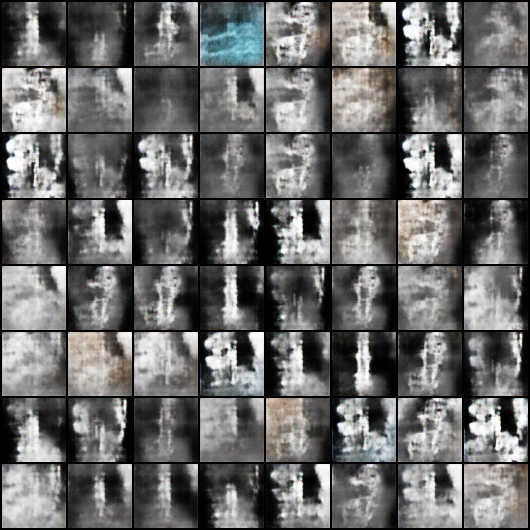

In [50]:
from IPython.display import Image
Image('./generated/generated-images-0999.png')

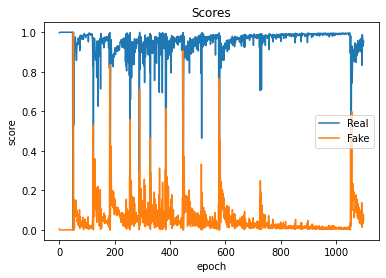

In [52]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');